In [3]:
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import pandas as pd

## 2 - Data visualization and pre-processing

In [4]:
data = np.load("ECoG.npz")
X = data['Xall']
Y = data['Yall']
Fe = data['Fe']

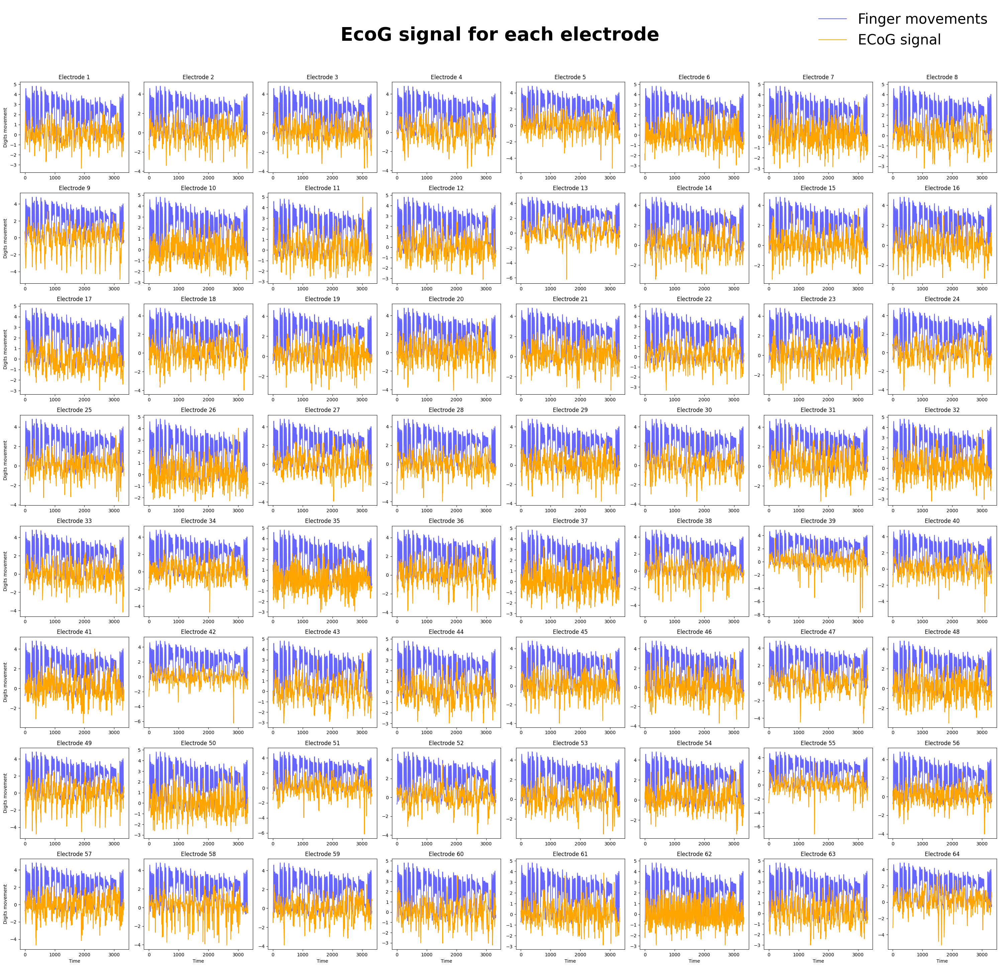

In [5]:
n_rows, n_cols = (8, 8)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 30))

# Titre global pour la figure
fig.suptitle("EcoG signal for each electrode", fontsize=40, y=0.97, fontweight='bold')

for i_row in range(n_rows):
    for i_col in range(n_cols):
        axes[i_row, i_col].plot(Y, label='Finger movements', alpha=0.6, color='blue')
        axes[i_row, i_col].plot(X[:, i_row * n_cols + i_col], label='ECoG signal', color='orange')
        axes[i_row, i_col].set_title(f'Electrode {i_row * n_cols + i_col + 1}')
        
        if i_row == n_rows - 1:
            axes[i_row, i_col].set_xlabel('Time')
        
        if i_col == 0:
            axes[i_row, i_col].set_ylabel('Digits movement')

# Légende globale
fig.legend(['Finger movements', 'ECoG signal'], loc='upper right', fontsize=30, frameon=False)
plt.tight_layout(rect=[0, 0.03, 1, 0.95]) 
plt.show()



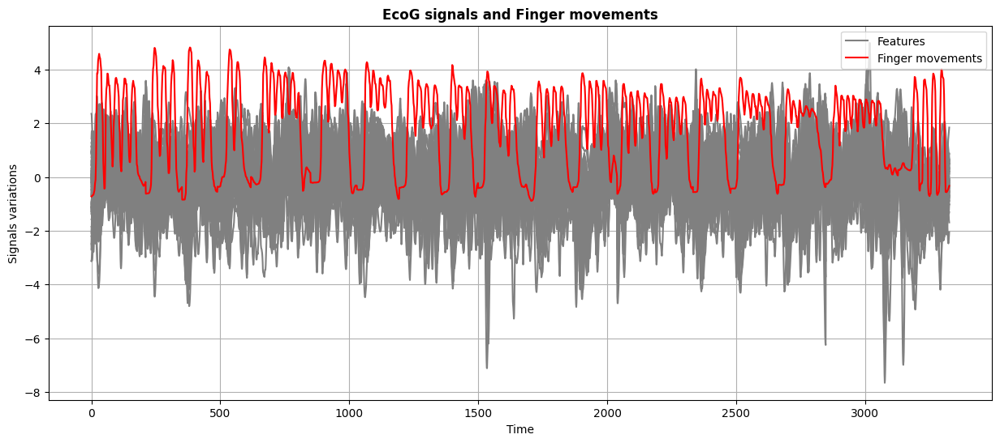

In [6]:
plt.figure(figsize=(15, 6))

for i in range(0, 63):
    plt.plot(X[:, i], color = 'gray')
plt.plot(X[:, 63], color = 'gray', label = 'Features')
plt.plot(Y, color = 'red', label = 'Finger movements')
plt.ylabel("Signals variations")
plt.xlabel("Time")
plt.grid(True)
plt.title("EcoG signals and Finger movements", fontweight='bold')
plt.legend(loc='upper right')

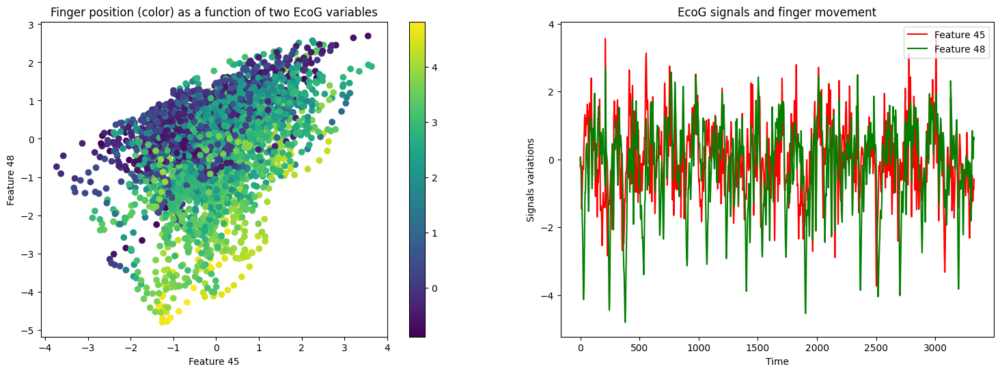

In [7]:
plt.figure(figsize=(18, 6))

plt.subplot(1, 2, 1)
plt.scatter(X[:,45],X[:,48], c=Y, cmap='viridis')
plt.xlabel("Feature 45")
plt.ylabel("Feature 48")
plt.title("Finger position (color) as a function of two EcoG variables")
plt.colorbar()


plt.subplot(1, 2, 2)
plt.plot(X[:, 45], color = 'red', label = 'Feature 45')
plt.plot(X[:, 48], color = 'green', label = 'Feature 48')
plt.xlabel("Time")
plt.ylabel("Signals variations")
plt.title("EcoG signals and finger movement")
plt.legend(loc='upper right')

## Observation: 

The scatter plot from features 45 and 48 makes it possible to identify a first color gradient along feature 48 representing the movement of the finger. This is promising and may indicate that feature 48 certainly plays an important role in predicting finger movement.

In [8]:
X_train = X[:1000,:]
X_test = X[1000:, :]
Y_train = Y[:1000,:]
Y_test = Y[1000:, :]

## 3 - Least Squares regression (LS)

In [9]:
X_tild= np.concatenate((X_train, np.ones((X_train.shape[0], 1))), axis=1)

res = np.linalg.solve(np.dot(X_tild.T, X_tild), np.dot(X_tild.T, Y_train))

w_LS = res[:-1]
b_LS = res[-1]

Y_pred = np.dot(X_train,w_LS)  + b_LS
Y_pred_test = np.dot(X_test,w_LS)  + b_LS

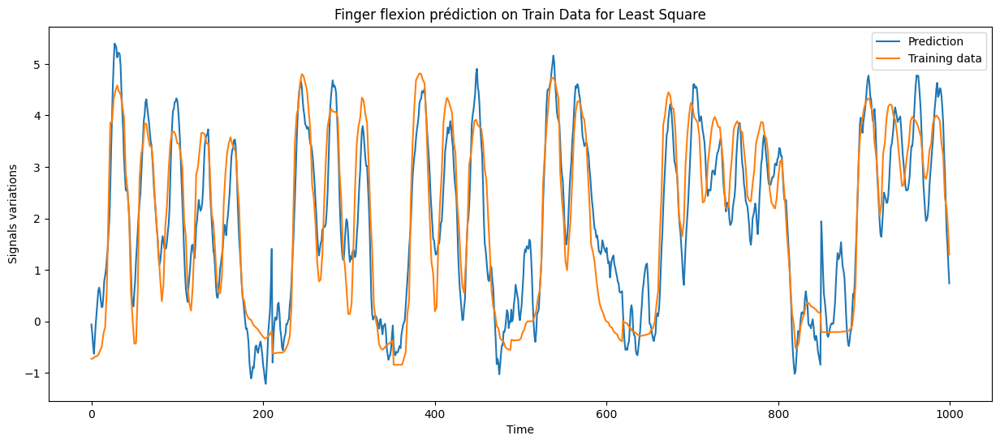

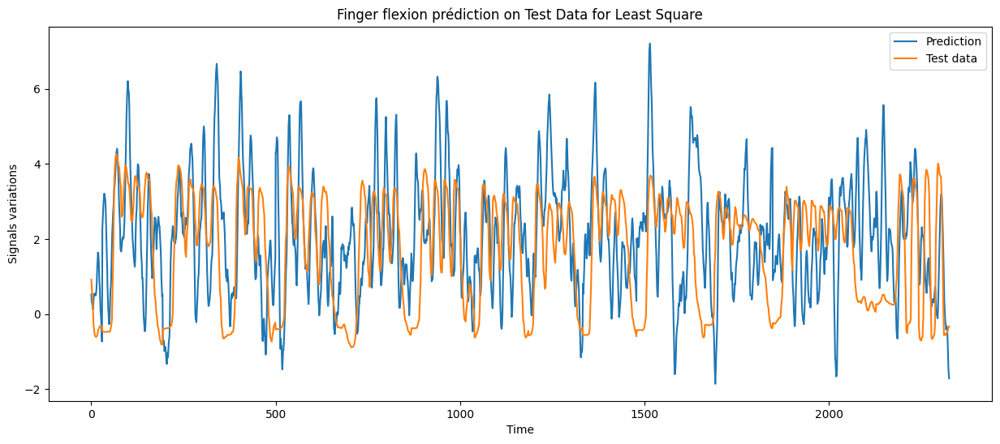

In [10]:
plt.figure(figsize=(15, 6))
plt.plot(Y_pred, label = 'Prediction')
plt.title('Finger flexion prédiction on Train Data for Least Square')
plt.xlabel("Time")
plt.ylabel("Signals variations")
plt.plot(Y_train, label = 'Training data')
plt.legend()
plt.show()

plt.figure(figsize=(15, 6))
plt.title('Finger flexion prédiction on Test Data for Least Square')
plt.xlabel("Time")
plt.ylabel("Signals variations")
plt.plot(Y_pred_test, label = 'Prediction')
plt.plot(Y_test, label = 'Test data')
plt.legend()
plt.show()

In [11]:
from sklearn.metrics import r2_score, mean_squared_error
from IPython.display import display

MSE_train_LS = mean_squared_error(Y_train, Y_pred)
MSE_test_LS = mean_squared_error(Y_test, Y_pred_test)

R2_train_LS = r2_score(Y_train, Y_pred)
R2_test_LS = r2_score(Y_test, Y_pred_test)


data = {
    "Least Square": [R2_train_LS, R2_test_LS, MSE_train_LS, MSE_test_LS],
}
index = ["R² (Train)", "R² (Test)", "MSE (Train)", "MSE (Test)"]

df_results = pd.DataFrame(data, index=index)

display(df_results)

,Least Square
R² (Train),0.839500
R² (Test),-0.428170
MSE (Train),0.504065
MSE (Test),3.045537


## Observations : 

- The R² and MSE values suggest that the least squares regression model fits the training data reasonably well (R²_train ≈ 0.81, low MSE), indicating it captures some of the underlying structure. 
- However, the test performance is poor (R²_test ≈ -0.28, high MSE), suggesting significant overfitting. 
- This gap between train and test metrics implies that the model generalizes poorly, likely due to the high dimensionality of the data relative to the sample size or the lack of regularization in this linear model. Further adjustments, such as using regularization techniques like Ridge or Lasso, may help improve test performance.

In [12]:
import pandas as pd
w_LS_flat = [item[0] for item in w_LS]
df = pd.DataFrame(w_LS, columns=["Least Square"])
df.loc[len(df)] = [b_LS[0]]
df.index = [f"Weight {i+1}" if i < len(w_LS) else "Bias" for i in range(len(w_LS) + 1)]

# Limiter l'affichage du tableau si trop long
def display_table(df, max_rows=10):
    if len(df) > max_rows:
        display_df = pd.concat([df.head(max_rows//2), pd.DataFrame([["..."]], columns=df.columns, index=["..."]), df.tail(max_rows//2)])
    else:
        display_df = df
    print(display_df)

display_table(df)


          Least Square
Weight 1     -0.091507
Weight 2      0.108616
Weight 3     -0.073058
Weight 4     -0.279383
Weight 5      0.251121
...                ...
Weight 61    -0.164692
Weight 62    -0.236384
Weight 63     0.042443
Weight 64     0.569436
Bias          1.900813


In [13]:
from sklearn.linear_model import LinearRegression

model_linear = LinearRegression()
model_linear.fit(X_train, Y_train)

w_sk = model_linear.coef_
b_sk = model_linear.intercept_


w_LS_flat = [item[0] for item in w_LS]


df = pd.DataFrame({'Least Square': w_LS_flat, 'Sklearn LinearRegression': w_sk[0]})


df.loc[len(df)] = [b_LS[0], b_sk[0]]
df.index = [f"Weight {i+1}" if i < len(w_LS_flat) else "Bias" for i in range(len(w_LS_flat) + 1)]

def display_table(df, max_rows=10):
    if len(df) > max_rows:
        display_df = pd.concat([df.head(max_rows//2), pd.DataFrame([["...", "..."]], columns=df.columns, index=["..."]), df.tail(max_rows//2)])
    else:
        display_df = df
    print(display_df)

display_table(df)

          Least Square Sklearn LinearRegression
Weight 1     -0.091507                -0.091507
Weight 2      0.108616                 0.108616
Weight 3     -0.073058                -0.073058
Weight 4     -0.279383                -0.279383
Weight 5      0.251121                 0.251121
...                ...                      ...
Weight 61    -0.164692                -0.164692
Weight 62    -0.236384                -0.236384
Weight 63     0.042443                 0.042443
Weight 64     0.569436                 0.569436
Bias          1.900813                 1.900813


## Observation :

The linear model carried out previously corresponds well to Sklearn's linear regression.

## 4  - Ridge regression

In [14]:
from sklearn.linear_model import Ridge

model_ridge = Ridge(alpha=1)
model_ridge.fit(X_train, Y_train)

Y_pred_test = model_ridge.predict(X_test)
Y_pred = model_ridge.predict(X_train)

MSE_train_ridge  = mean_squared_error(Y_train, Y_pred)
MSE_test_ridge  = mean_squared_error(Y_test, Y_pred_test)

R2_train_ridge = r2_score(Y_train, Y_pred)
R2_test_ridge  = r2_score(Y_test, Y_pred_test)

data = {
    "Least Square": [R2_train_LS, R2_test_LS, MSE_train_LS, MSE_test_LS],
    "Ridge Regression (alpha= 1)": [R2_train_ridge, R2_test_ridge, MSE_train_ridge, MSE_test_ridge]
}
index = ["R² (Train)", "R² (Test)", "MSE (Train)", "MSE (Test)"]

df_results = pd.DataFrame(data, index=index)

# Affichage du tableau
display(df_results)

,Least Square,Ridge Regression (alpha= 1)
R² (Train),0.839500,0.839465
R² (Test),-0.428170,-0.408618
MSE (Train),0.504065,0.504177
MSE (Test),3.045537,3.003843


## Observation : 

For alpha = 1 (or lambda = 1), we find the results of the linear model without regularization.

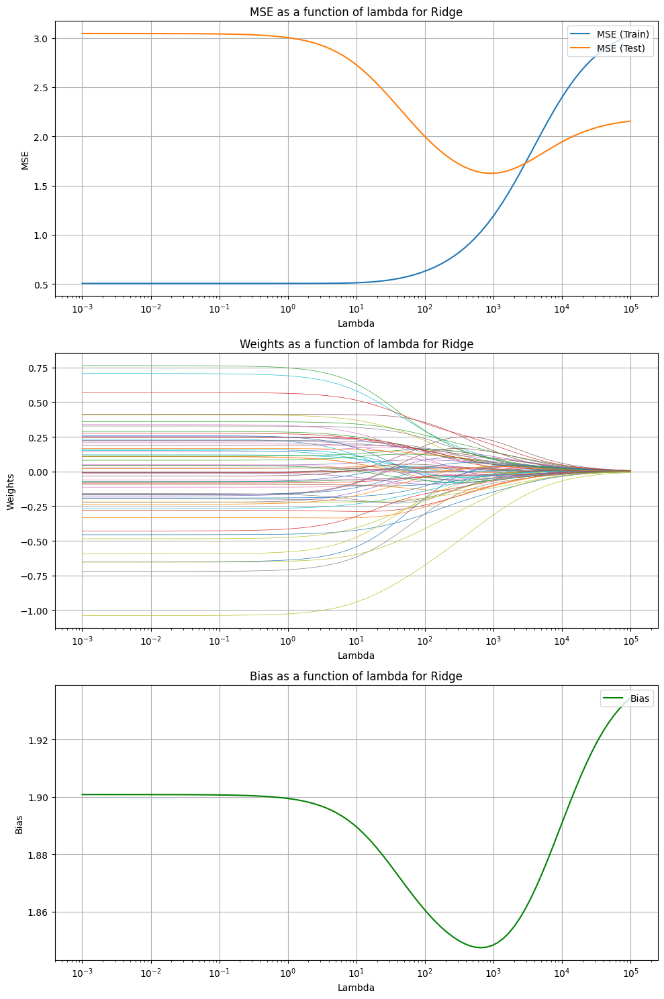

In [15]:
list_lmbd = np.logspace(-3, 5, 100)
MSE_train = []
MSE_test = []
x = []
weight = []
biais = []
for i,reg in enumerate(list_lmbd) : 
    model_ridge = Ridge(alpha=reg)
    model_ridge.fit(X_train, Y_train)
    Y_pred_test = model_ridge.predict(X_test)
    Y_pred = model_ridge.predict(X_train)
    weight.append(model_ridge.coef_)
    biais.append(model_ridge.intercept_)
    MSE_train.append(mean_squared_error(Y_train, Y_pred))
    MSE_test.append(mean_squared_error(Y_test,Y_pred_test))
    x.append(reg)

weight_transform = np.zeros((64, 100))  # sur chaque ligne l'évolution d'un poids en fonction de lambda
for i in range(100): # on parcours les lambda
    for j in range(64) : 
        weight_transform[j,i] = (weight[i][0][j]) 

plt.figure(figsize=(10, 15))

# First subplot: MSE as a function of lambda
plt.subplot(3, 1, 1)
plt.plot(x, MSE_train, label='MSE (Train)')
plt.plot(x, MSE_test, label='MSE (Test)')
plt.title('MSE as a function of lambda for Ridge')
plt.xlabel('Lambda')
plt.xscale('log')
plt.ylabel('MSE')
plt.grid(True)
plt.legend(loc='upper right')

# Second subplot: Linear parameters (weights) as a function of lambda
plt.subplot(3, 1, 2)
for i in range(64):
    plt.plot(x, weight_transform[i, :], linewidth=0.5)
plt.title('Weights as a function of lambda for Ridge')
plt.xlabel('Lambda')
plt.xscale('log')
plt.ylabel('Weights')
plt.grid(True)

# Third subplot: Bias as a function of lambda
plt.subplot(3, 1, 3)
plt.plot(x, biais, label='Bias', color='green')
plt.title('Bias as a function of lambda for Ridge')
plt.xlabel('Lambda')
plt.xscale('log')
plt.ylabel('Bias')
plt.grid(True)
plt.legend(loc='upper right')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


In [16]:
# Selection des coefficients correspondant à la plus faible MSE sur l'echantillon test
minimum =  min(MSE_test)
index = MSE_test.index(minimum)

w_min = weight_transform[:, index]
b_min = biais[index]

print('Lambda minimizing MSE on test sample:',list_lmbd[index])
print('Minimal MSE on test sample :', minimum)

Lambda minimizing MSE on test sample: 954.5484566618347
Minimal MSE on test sample : 1.6239059826952076


In [17]:
model_ridge = Ridge(alpha=1010.102)
model_ridge.fit(X_train, Y_train)

Y_pred_test = model_ridge.predict(X_test)
Y_pred = model_ridge.predict(X_train)

w_ridge = model_ridge.coef_[0]
b_ridge = model_ridge.intercept_[0]

MSE_train_ridge_opt = mean_squared_error(Y_train, Y_pred)
MSE_test_ridge_opt = mean_squared_error(Y_test, Y_pred_test)

R2_train_ridge_opt = r2_score(Y_train, Y_pred)
R2_test_ridge_opt = r2_score(Y_test, Y_pred_test)


data = {
    "Linear Model with LS Estimator": [R2_train_LS, R2_test_LS, MSE_train_LS, MSE_test_LS],
    "Ridge Regression (lambda = 955)": [R2_train_ridge_opt, R2_test_ridge_opt, MSE_train_ridge_opt, MSE_test_ridge_opt]
}
index = ["R² (Train)", "R² (Test)", "MSE (Train)", "MSE (Test)"]

df_results = pd.DataFrame(data, index=index)

display(df_results)


,Linear Model with LS Estimator,Ridge Regression (lambda = 955)
R² (Train),0.839500,0.619335
R² (Test),-0.428170,0.238189
MSE (Train),0.504065,1.195514
MSE (Test),3.045537,1.624542


## Observations :

- The table compares the performance of the Linear Model with LS Estimator and a the model with a Ridge Regression with an optimal lambda of 955. The LS Estimator fits the training data fairly well, with an $R^2$ of 0.81, but performs poorly on the test data, indicated by a negative $R^2$ of -0.28 and a high MSE of 3.00. This shows overfitting, as the model doesn’t generalize well.

- The Ridge Regression model, with regularization, improves stability by reducing the MSE on both training and test sets (1.20 and 1.62, respectively). Although the test $R^2$ is still negative (-2.25), the lower MSE suggests Ridge Regression is better at controlling overfitting, even if the test performance remains imperfect. The optimized lambda helps control the model complexity, but further tuning or additional regularization techniques may be necessary to improve test performance further.

<>:6: SyntaxWarning: invalid escape sequence '\l'
<>:6: SyntaxWarning: invalid escape sequence '\l'
/var/folders/gq/49frcwvx3x7g0rj8zhy9bdjh0000gn/T/ipykernel_51681/2422851363.py:6: SyntaxWarning: invalid escape sequence '\l'
  plt.title("Predictions vs True Values on the Training and Test sets for Ridge $\lambda = 955$")


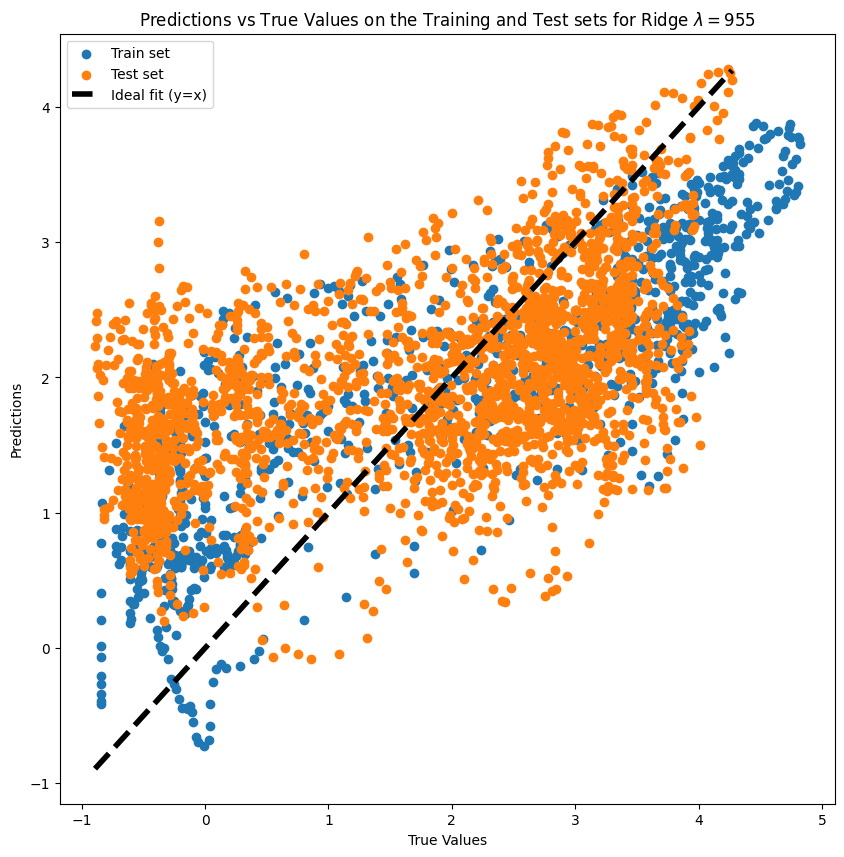

In [18]:
plt.figure(figsize=(10, 10))
plt.scatter(Y_train,Y_pred, label = 'Train set')
plt.scatter(Y_test,Y_pred_test, label = 'Test set')
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title("Predictions vs True Values on the Training and Test sets for Ridge $\lambda = 955$")
plt.plot([min(Y_test), max(Y_test)], [min(Y_test), max(Y_test)], color='black',linewidth=4, linestyle='--', label="Ideal fit (y=x)")
plt.legend()
plt.show()


## Observations:

The figure shows the Ridge regression predictions versus the true values for both the training and test sets. Ideally, points should align closely with the black line ($y = x$), which represents a perfect fit. However, there is significant scatter, especially in the test set (orange), indicating limited model generalization. The denser clustering of points near the line for the training set (blue) suggests a better fit on training data, while the broader spread for test data reflects the generalization issues previously observed in the $R^2$ and MSE values.

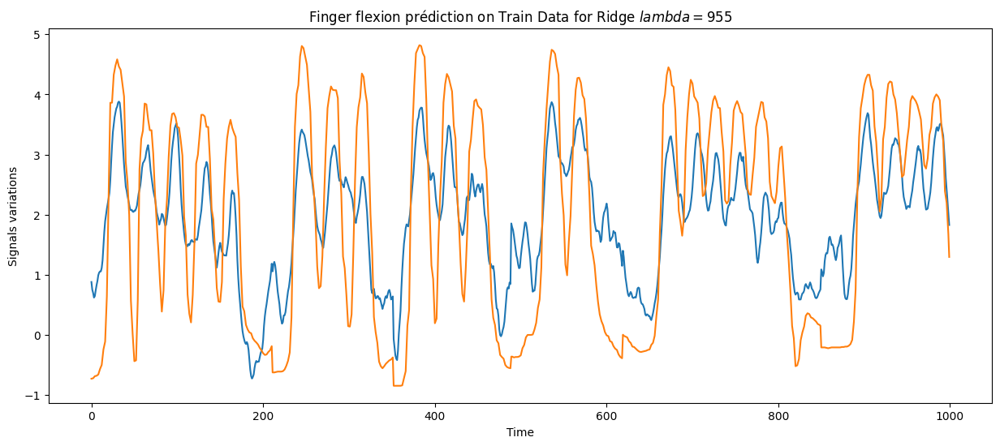

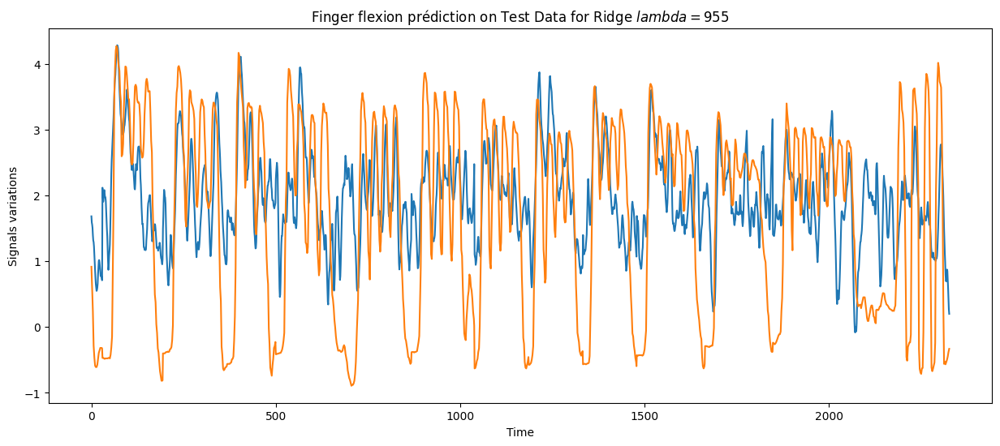

In [19]:
plt.figure(figsize=(15, 6))
plt.plot(Y_pred)
plt.title('Finger flexion prédiction on Train Data for Ridge $lambda = 955$')
plt.xlabel("Time")
plt.ylabel("Signals variations")
plt.plot(Y_train)
plt.show()

plt.figure(figsize=(15, 6))
plt.title('Finger flexion prédiction on Test Data for Ridge $lambda = 955$')
plt.xlabel("Time")
plt.ylabel("Signals variations")
plt.plot(Y_pred_test)
plt.plot(Y_test)
plt.show()

## Observations:

The interpretation made above regarding Ridge's inability to generalize sufficiently to obtain a good quality prediction on the test sample is confirmed by these temporal observations.

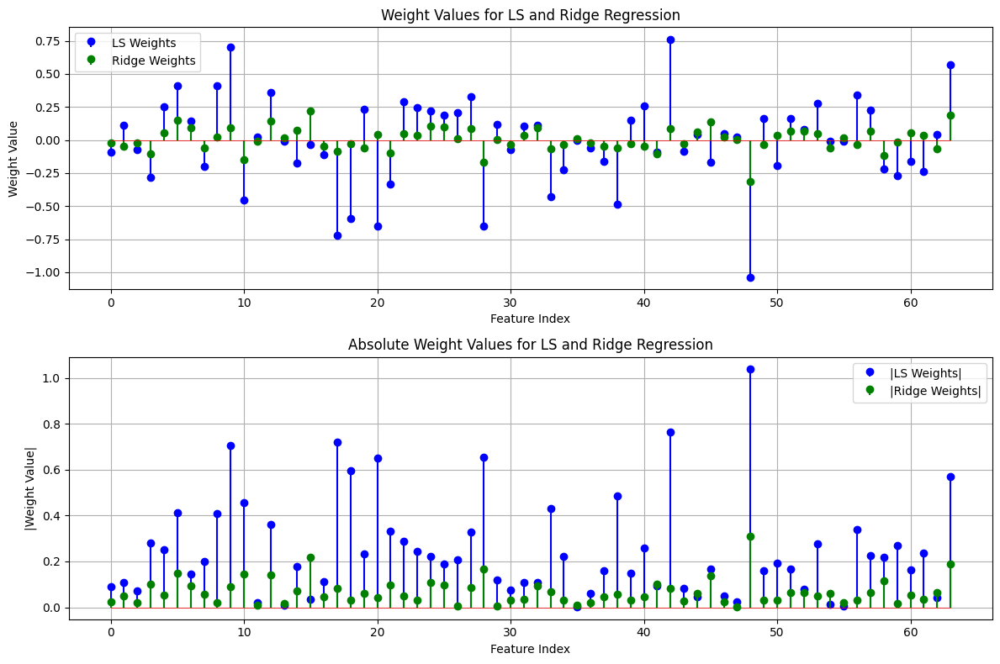

In [20]:
plt.figure(figsize=(12, 8))
x_0 = list(range(len(w_ridge)))
y_0 = np.zeros(len(w_ridge))
# Original weight values for LS and Ridge
plt.subplot(2, 1, 1)
plt.stem(w_LS, linefmt='blue', markerfmt='bo', label='LS Weights',basefmt=" ")
plt.stem(w_ridge, linefmt='green', markerfmt='go', label='Ridge Weights', basefmt=" ")
plt.plot(x_0, y_0, color ='red', linewidth= 0.5)
plt.title("Weight Values for LS and Ridge Regression")
plt.xlabel("Feature Index")
plt.ylabel("Weight Value")
plt.legend()
plt.grid(True)

# Absolute weight values for LS and Ridge
plt.subplot(2, 1, 2)
plt.stem(np.abs(w_LS), linefmt='blue', markerfmt='bo', label='|LS Weights|',basefmt=" ")
plt.plot(x_0, y_0, color ='red', linewidth= 0.5)
plt.stem(np.abs(w_ridge), linefmt='green', markerfmt='go', label='|Ridge Weights|', basefmt=" ")
plt.title("Absolute Weight Values for LS and Ridge Regression")
plt.xlabel("Feature Index")
plt.ylabel("|Weight Value|")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

## Observations:

- The plots show the weight values and their absolute values for both the Least Squares (LS) and Ridge regression estimators. In the first plot, we observe that the LS weights (in blue) have a wider range of values, with several weights having large positive or negative magnitudes, indicating high sensitivity to certain features. In contrast, the Ridge weights (in green) are much more constrained, with most weights centered around zero. This is due to Ridge regression's regularization, which penalizes large weights and reduces their variance.

- The second plot, displaying the absolute weight values, further highlights that LS assigns high importance to certain features (with large absolute values), while Ridge regression consistently dampens the weight magnitudes. This suggests that LS might overemphasize certain features, leading to overfitting, whereas Ridge regression aims for a more balanced influence across features, potentially improving generalization. Thus, LS and Ridge do not show the same important variables, as Ridge reduces the impact of features with high variance in LS.

## 5 - Variable selection with the Lasso

In [21]:
from sklearn.linear_model import Lasso

model_lasso = Lasso()
model_lasso.fit(X_train, Y_train)

Y_pred_test = model_lasso.predict(X_test)
Y_pred = model_lasso.predict(X_train)

MSE_train_lasso = mean_squared_error(Y_train, Y_pred)
MSE_test_lasso = mean_squared_error(Y_test,Y_pred_test)

R2_train_lasso = r2_score(Y_train, Y_pred)
R2_test_lasso = r2_score(Y_test, Y_pred_test)

data = {
    "Linear Model with LS Estimator": [R2_train_LS, R2_test_LS, MSE_train_LS, MSE_test_LS],
    "Ridge Regression (lambda = 955)": [R2_train_ridge_opt, R2_test_ridge_opt, MSE_train_ridge_opt, MSE_test_ridge_opt],
    "Lasso (lambda = 1, default value)": [R2_train_lasso, R2_test_lasso, MSE_train_lasso, MSE_test_lasso]
}
index = ["R² (Train)", "R² (Test)", "MSE (Train)", "MSE (Test)"]

df_results = pd.DataFrame(data, index=index)

# Affichage du tableau
display(df_results)


,Linear Model with LS Estimator,Ridge Regression (lambda = 955),"Lasso (lambda = 1, default value)"
R² (Train),0.839500,0.619335,0.000000
R² (Test),-0.428170,0.238189,-0.027293
MSE (Train),0.504065,1.195514,3.140597
MSE (Test),3.045537,1.624542,2.190676


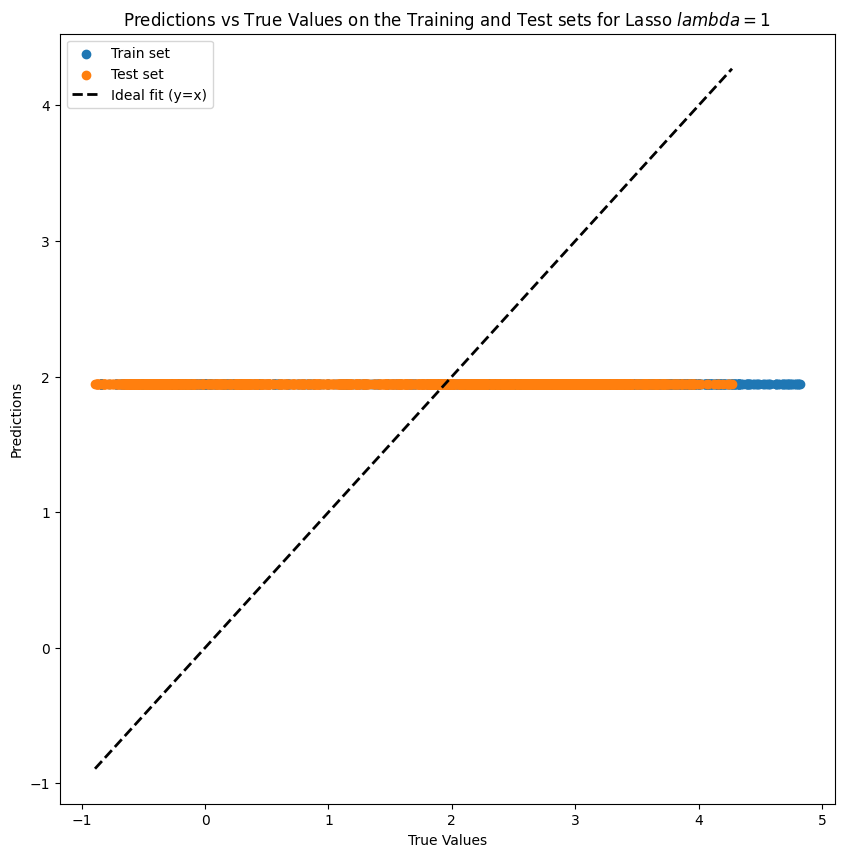

In [22]:
plt.figure(figsize=(10, 10))
plt.scatter(Y_train,Y_pred, label = 'Train set')
plt.scatter(Y_test,Y_pred_test, label = 'Test set')
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title("Predictions vs True Values on the Training and Test sets for Lasso $lambda = 1$")
plt.plot([min(Y_test), max(Y_test)], [min(Y_test), max(Y_test)], color='black',linewidth=2, linestyle='--', label="Ideal fit (y=x)")
plt.legend()
plt.show()

# Observations : 

- By default, alpha = 1 in Lasso. Here, we observe that this regularization is too strong and leads to the elimination of all components.

- For alpha = 0, we get the equivalent of Least Square.

- With a properly chosen alpha value between 0 and 0.5, the results are better.

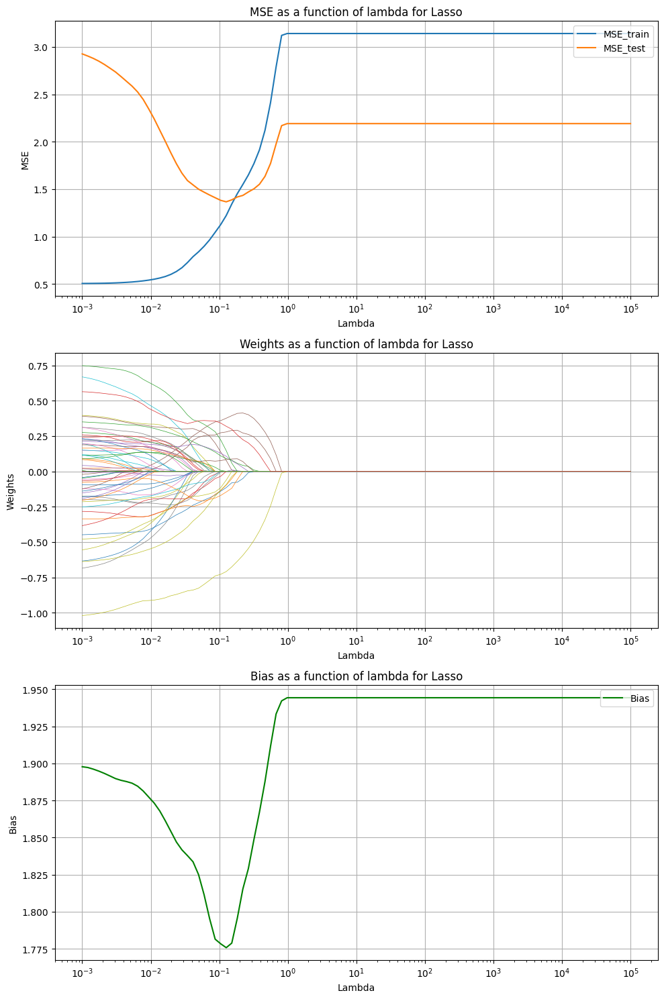

In [23]:
lst_reg = np.logspace(-3, 5, 100)
MSE_train = []
MSE_test = []
x = []
weight = []
biais = []
for i,reg in enumerate(lst_reg):
    model_lasso = Lasso(alpha=reg)
    model_lasso.fit(X_train, Y_train)
    Y_pred_test = model_lasso.predict(X_test)
    Y_pred = model_lasso.predict(X_train)
    weight.append(model_lasso.coef_)
    biais.append(model_lasso.intercept_)
    MSE_train.append(mean_squared_error(Y_train, Y_pred))
    MSE_test.append(mean_squared_error(Y_test, Y_pred_test))
    x.append(reg)
    
weight_transform = np.zeros((64, 100))  # sur chaque ligne l'évolution d'un poids en fonction de lambda
for i in range(100): # on parcours les lambda
    for j in range(64) : 
        weight_transform[j,i] = (weight[i][j]) # pour un lamda donné, on remplit la colonne dans weight_transform


plt.figure(figsize=(10, 15))

# First subplot: MSE as a function of lambda
plt.subplot(3, 1, 1)
plt.plot(x, MSE_train, label='MSE_train')
plt.plot(x, MSE_test, label='MSE_test')
plt.title('MSE as a function of lambda for Lasso')
plt.xlabel('Lambda')
plt.xscale('log')
plt.ylabel('MSE')
plt.grid(True)
plt.legend(loc='upper right')

# Second subplot: Linear parameters (weights) as a function of lambda
plt.subplot(3, 1, 2)
for i in range(64):
    plt.plot(x, weight_transform[i, :], linewidth=0.5)
plt.title('Weights as a function of lambda for Lasso')
plt.xlabel('Lambda')
plt.xscale('log')
plt.ylabel('Weights')
plt.grid(True)

# Third subplot: Bias as a function of lambda
plt.subplot(3, 1, 3)
plt.plot(x, biais, label='Bias', color='green')
plt.title('Bias as a function of lambda for Lasso')
plt.xlabel('Lambda')
plt.xscale('log')
plt.ylabel('Bias')
plt.grid(True)
plt.legend(loc='upper right')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

## Observations : 

- MSE vs. Lambda: The training MSE increases sharply as lambda grows, while the test MSE initially decreases, stabilizing at higher lambda values. This suggests an optimal lambda range where regularization reduces overfitting before becoming too strong.

- Weights vs. Lambda: The weights decrease towards zero as lambda increases, with many reaching exactly zero. This indicates that Lasso selects relevant features by shrinking less important ones to zero. When lambda is very large, all weights reach 0.

- Bias vs. Lambda: The bias varies slightly at low lambda values but stabilizes as lambda is to large, because all the weights already reach 0. 

In [24]:
minimum =  min(MSE_test)
index = MSE_test.index(minimum)

w_min = weight_transform[:, index]
b_min = biais[index]


print('Lambda minimizing MSE on test sample (Lasso):',list_lmbd[index])
print('Minimal MSE on test sample (Lasso) :', minimum)

Lambda minimizing MSE on test sample (Lasso): 0.1261856883066021
Minimal MSE on test sample (Lasso) : 1.3659542352560026


In [25]:
model_lasso = Lasso(alpha = list_lmbd[index], fit_intercept = True)
model_lasso.fit(X_train, Y_train)

Y_pred_test = model_lasso.predict(X_test)
Y_pred = model_lasso.predict(X_train)

w_lasso = model_lasso.coef_
b_lasso = model_lasso.intercept_

MSE_train_lasso_opt = mean_squared_error(Y_pred, Y_train)
MSE_test_lasso_opt = mean_squared_error(Y_pred_test,Y_test)

R2_train_lasso_opt = r2_score(Y_pred, Y_train)
R2_test_lasso_opt = r2_score(Y_test, Y_pred_test)


data = {
    "Linear Model with LS Estimator": [R2_train_LS, R2_test_LS, MSE_train_LS, MSE_test_LS],
    "Ridge Regression (lambda = 955)": [R2_train_ridge_opt, R2_test_ridge_opt, MSE_train_ridge_opt, MSE_test_ridge_opt],
    "Lasso (lambda = 0,126)": [R2_train_lasso_opt, R2_test_lasso_opt, MSE_train_lasso_opt, MSE_test_lasso_opt]
}
index = ["R² (Train)", "R² (Test)", "MSE (Train)", "MSE (Test)"]

df_results = pd.DataFrame(data, index=index)

# Affichage du tableau
display(df_results)

,Linear Model with LS Estimator,Ridge Regression (lambda = 955),"Lasso (lambda = 0,126)"
R² (Train),0.839500,0.619335,0.012936
R² (Test),-0.428170,0.238189,0.359451
MSE (Train),0.504065,1.195514,1.221563
MSE (Test),3.045537,1.624542,1.365954


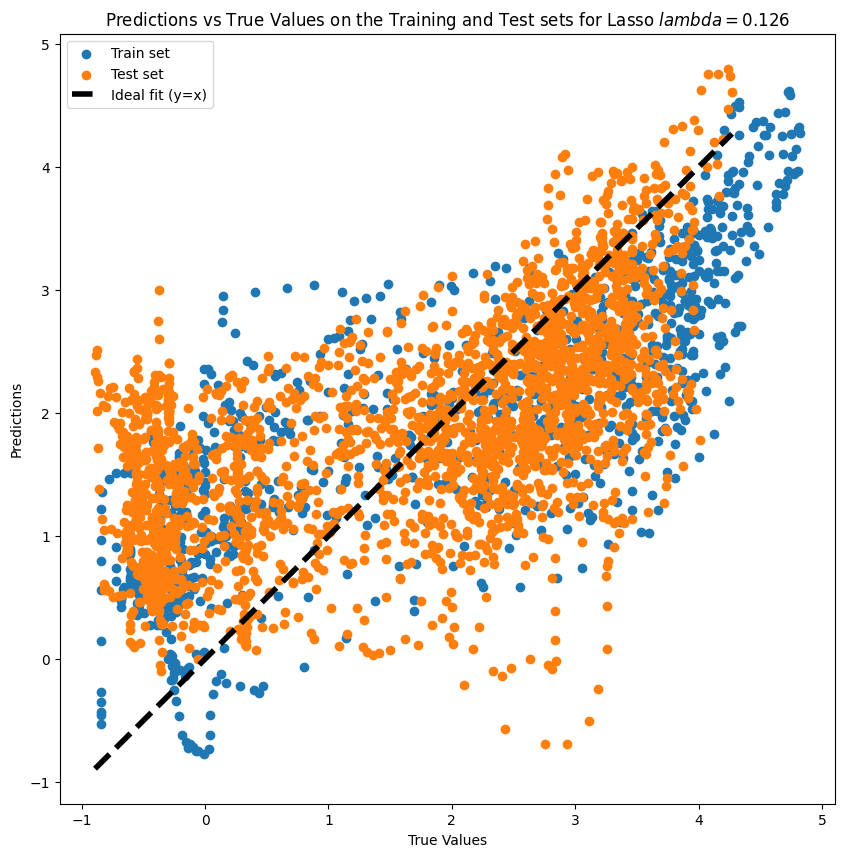

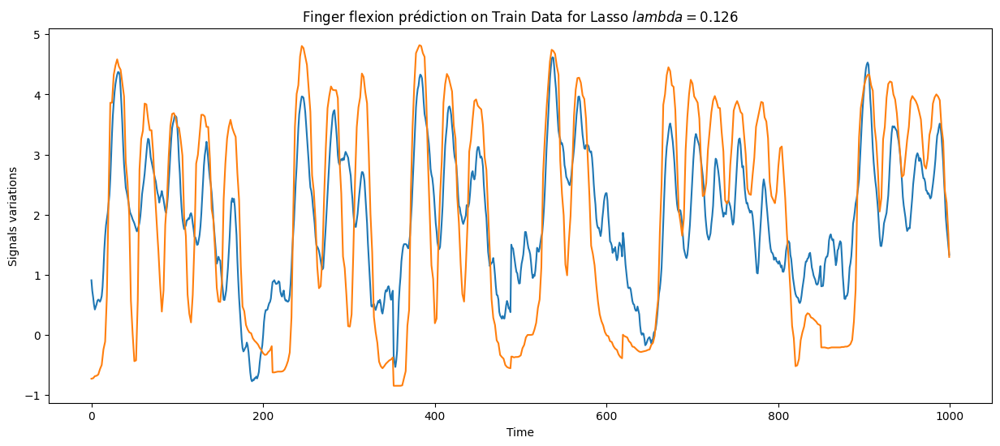

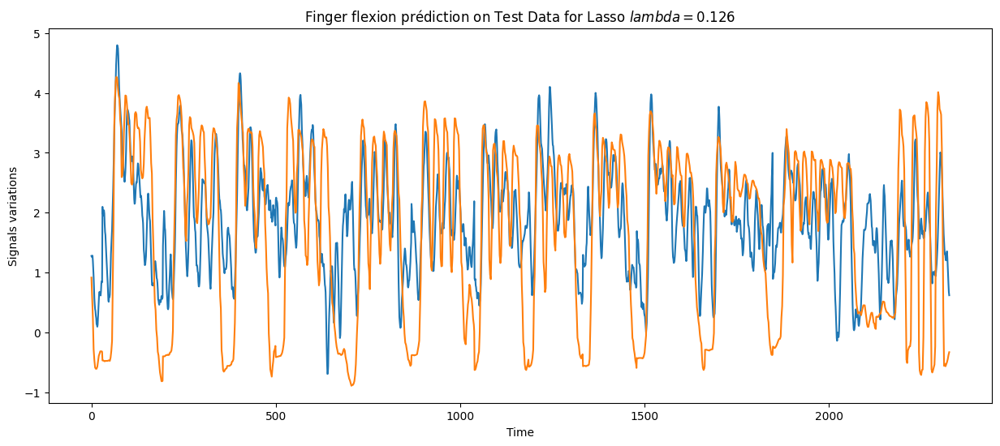

In [26]:
plt.figure(figsize=(10, 10))
plt.scatter(Y_train,Y_pred, label = 'Train set')
plt.scatter(Y_test,Y_pred_test, label = 'Test set')
plt.plot([min(Y_test), max(Y_test)], [min(Y_test), max(Y_test)], color='black',linewidth=4, linestyle='--', label="Ideal fit (y=x)")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title("Predictions vs True Values on the Training and Test sets for Lasso $lambda = 0.126$")
plt.legend()
plt.show()

plt.figure(figsize=(15, 6))
plt.plot(Y_pred)
plt.title('Finger flexion prédiction on Train Data for Lasso $lambda = 0.126$')
plt.xlabel("Time")
plt.ylabel("Signals variations")
plt.plot(Y_train)
plt.show()

plt.figure(figsize=(15, 6))
plt.title('Finger flexion prédiction on Test Data for Lasso $lambda = 0.126$')
plt.xlabel("Time")
plt.ylabel("Signals variations")
plt.plot(Y_pred_test)
plt.plot(Y_test)
plt.show()

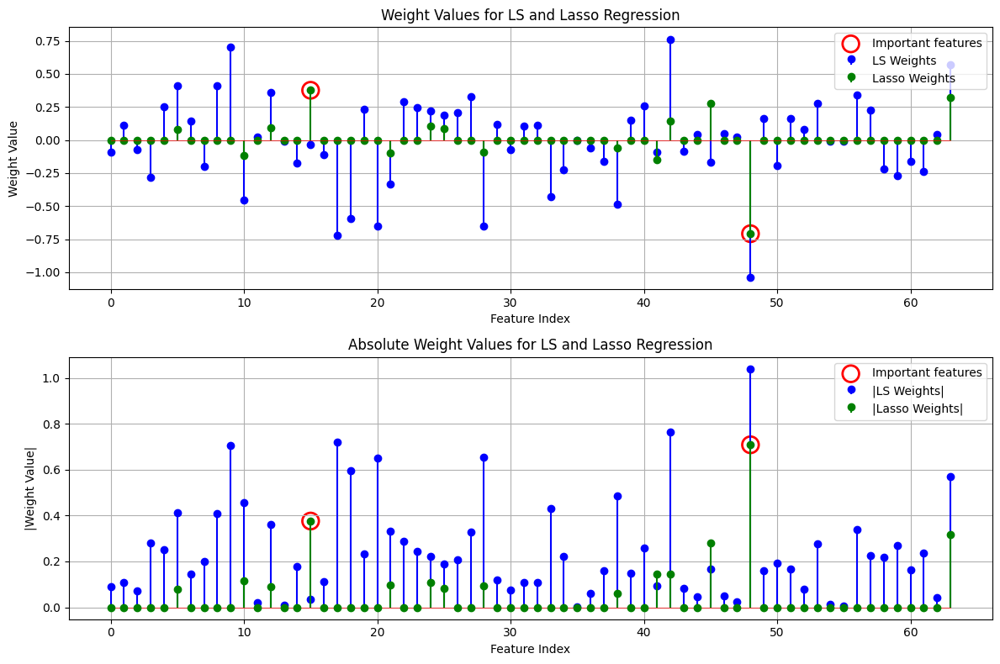

In [27]:
important_indices = [15, 48]

plt.figure(figsize=(12, 8))
x_0 = list(range(len(w_lasso)))
y_0 = np.zeros(len(w_lasso))

# Premier sous-graphe : Valeurs des poids pour LS et Lasso
plt.subplot(2, 1, 1)
plt.stem(w_LS, linefmt='blue', markerfmt='bo', label='LS Weights', basefmt=" ")
plt.stem(w_lasso, linefmt='green', markerfmt='go', label='Lasso Weights', basefmt=" ")
plt.plot(x_0, y_0, color='red', linewidth=0.5)
plt.scatter(important_indices, [w_lasso[i] for i in important_indices], edgecolor='red', facecolor='none', s=200, linewidth=2, label='Important features')
plt.title("Weight Values for LS and Lasso Regression")
plt.xlabel("Feature Index")
plt.ylabel("Weight Value")
plt.legend(loc = 'upper right')
plt.grid(True)

# Deuxième sous-graphe : Valeurs absolues des poids pour LS et Lasso
plt.subplot(2, 1, 2)
plt.stem(np.abs(w_LS), linefmt='blue', markerfmt='bo', label='|LS Weights|', basefmt=" ")
plt.plot(x_0, y_0, color='red', linewidth=0.5)
plt.stem(np.abs(w_lasso), linefmt='green', markerfmt='go', label='|Lasso Weights|', basefmt=" ")
plt.scatter(important_indices, [np.abs(w_lasso[i]) for i in important_indices], edgecolor='red', facecolor='none', s=200, linewidth=2, label='Important features')
plt.title("Absolute Weight Values for LS and Lasso Regression")
plt.xlabel("Feature Index")
plt.ylabel("|Weight Value|")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

Indices of the two largest absolute values: [48 15]


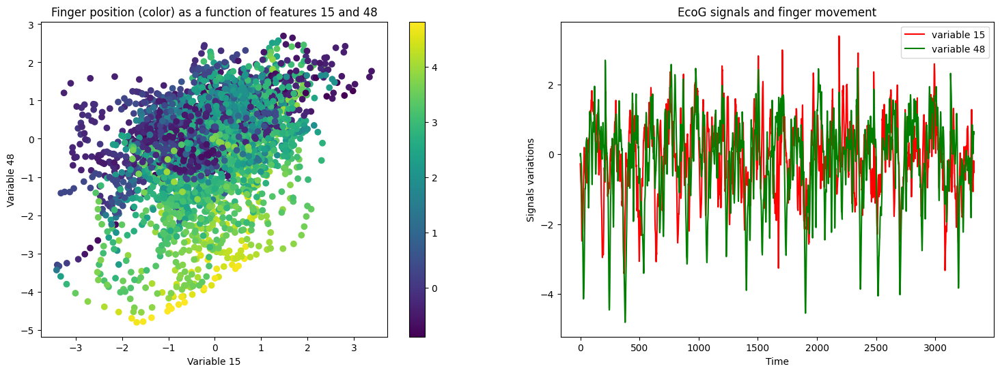

In [28]:
indices_largest = np.argsort(np.abs(w_lasso))[-2:][::-1]

print("Indices of the two largest absolute values:", indices_largest)
plt.figure(figsize=(18, 6))

plt.subplot(1, 2, 1)
plt.scatter(X[:,15],X[:,48], c=Y, cmap='viridis')
plt.xlabel("Variable 15")
plt.ylabel("Variable 48")
plt.title("Finger position (color) as a function of features 15 and 48")
plt.colorbar()


plt.subplot(1, 2, 2)
plt.plot(X[:, 15], color = 'red', label = 'variable 15')
plt.plot(X[:, 48], color = 'green', label = 'variable 48')
plt.xlabel("Time")
plt.ylabel("Signals variations")
plt.title("EcoG signals and finger movement")
plt.legend(loc='upper right')


In [29]:
num_non_zero = np.count_nonzero(w_lasso)
print("Number of selected variables by lasso from 64 :", num_non_zero)

Number of selected variables by lasso from 64 : 14


## Observations: 

The analysis with Lasso confirms the observation made at the beginning of the practical work concerning feature 48. Indeed, this feature was considered by Lasso as the most important for predicting finger flexion. Furthermore, the lasso regularization minimizing the MSE on the test sample only selects 14 features out of the 64 features of the EcoG dataset. This means that the number of electrodes could be divided by 4 to obtain similar results in the case where lasso regularization was used.

## 6 - Nonlinear regression

## Random Forest 

,Linear Model with LS Estimator,Ridge Regression (lambda = 955),"Lasso (lambda = 0,126)",Random forest (default value)
R² (Train),0.839500,0.619335,0.012936,0.993072
R² (Test),-0.428170,0.238189,0.359451,0.196172
MSE (Train),0.504065,1.195514,1.221563,0.021757
MSE (Test),3.045537,1.624542,1.365954,1.714143


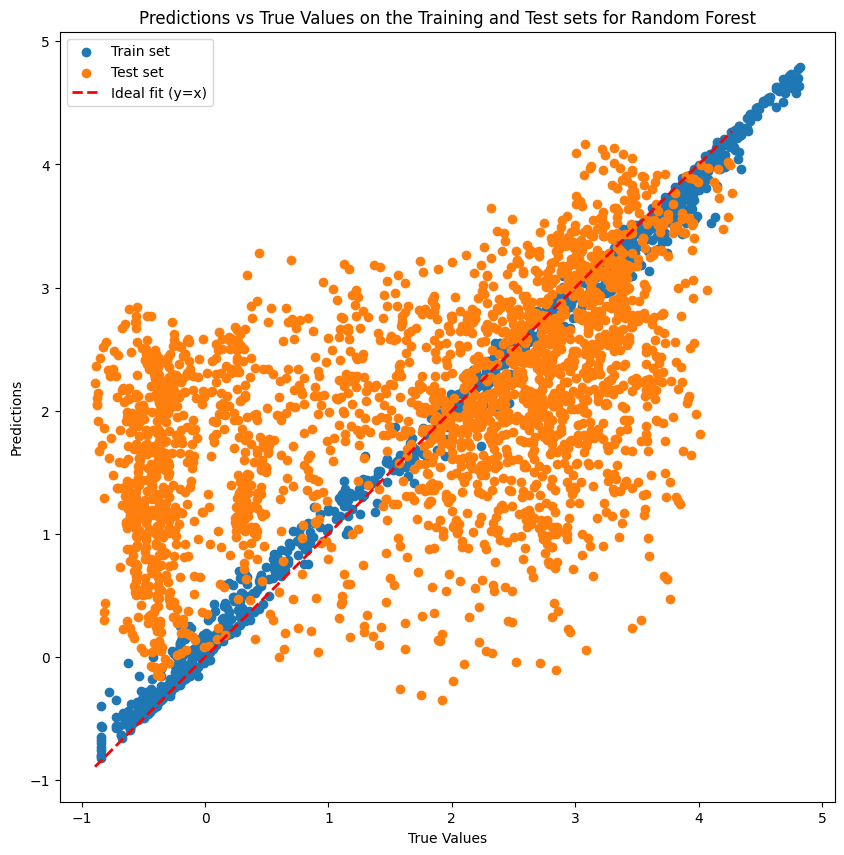

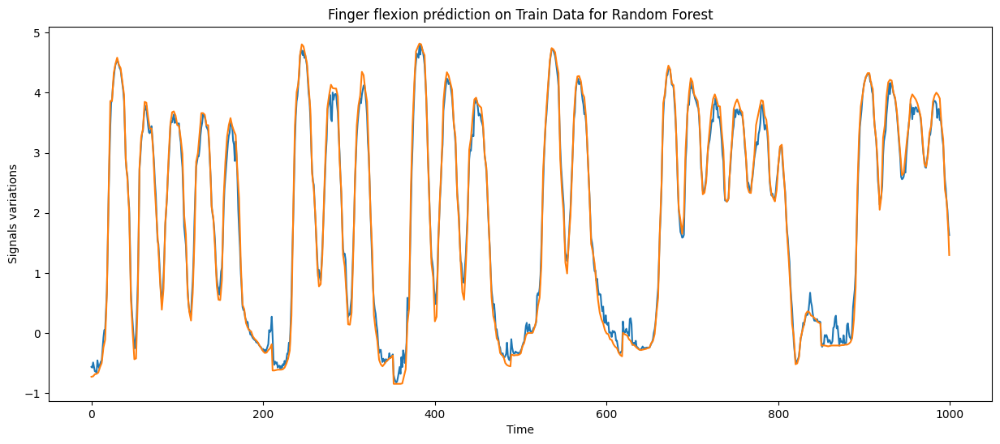

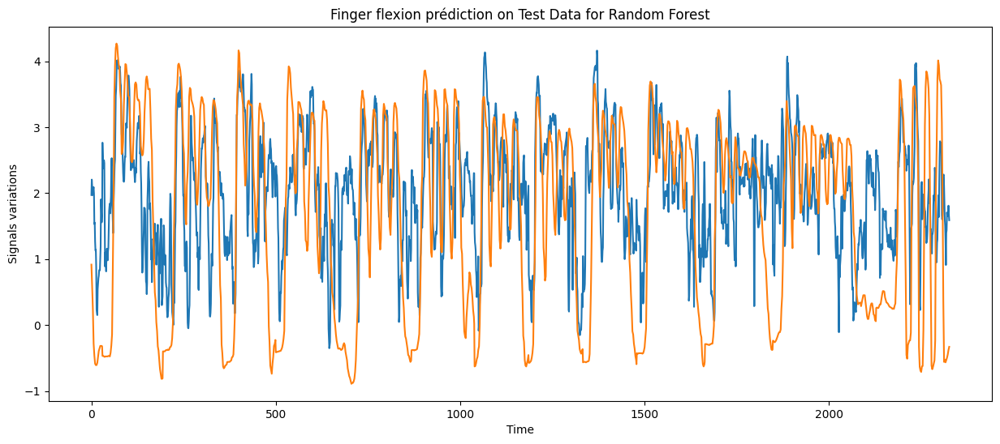

In [30]:
from sklearn.ensemble import RandomForestRegressor

model_rf = RandomForestRegressor()
model_rf.fit(X_train, Y_train.ravel())

Y_pred_test = model_rf.predict(X_test)
Y_pred = model_rf.predict(X_train)


MSE_train_rf = mean_squared_error(Y_train, Y_pred)
MSE_test_rf= mean_squared_error(Y_test, Y_pred_test)

R2_train_rf = r2_score(Y_train, Y_pred)
R2_test_rf = r2_score(Y_test, Y_pred_test)

data = {
    "Linear Model with LS Estimator": [R2_train_LS, R2_test_LS, MSE_train_LS, MSE_test_LS],
    "Ridge Regression (lambda = 955)": [R2_train_ridge_opt, R2_test_ridge_opt, MSE_train_ridge_opt, MSE_test_ridge_opt],
    "Lasso (lambda = 0,126)": [R2_train_lasso_opt, R2_test_lasso_opt, MSE_train_lasso_opt, MSE_test_lasso_opt],
    "Random forest (default value)": [R2_train_rf, R2_test_rf, MSE_train_rf, MSE_test_rf]
}
index = ["R² (Train)", "R² (Test)", "MSE (Train)", "MSE (Test)"]

df_results = pd.DataFrame(data, index=index)
display(df_results)


plt.figure(figsize=(10, 10))
plt.scatter(Y_train,Y_pred, label = 'Train set')
plt.scatter(Y_test,Y_pred_test, label = 'Test set')
plt.plot([min(Y_test), max(Y_test)], [min(Y_test), max(Y_test)], color='red',linewidth=2, linestyle='--', label="Ideal fit (y=x)")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title("Predictions vs True Values on the Training and Test sets for Random Forest")
plt.legend()
plt.show()

plt.figure(figsize=(15, 6))
plt.plot(Y_pred)
plt.title('Finger flexion prédiction on Train Data for Random Forest')
plt.xlabel("Time")
plt.ylabel("Signals variations")
plt.plot(Y_train)
plt.show()

plt.figure(figsize=(15, 6))
plt.title('Finger flexion prédiction on Test Data for Random Forest')
plt.xlabel("Time")
plt.ylabel("Signals variations")
plt.plot(Y_pred_test)
plt.plot(Y_test)
plt.show()

,Linear Model with LS Estimator,Ridge Regression (lambda = 955),Lasso (lambda = 0.126),Random forest (default value),Random Forest (optimized)
R² (Train),0.839500,0.619335,0.012936,0.993072,0.991040
R² (Test),-0.428170,0.238189,0.359451,0.196172,0.241847
MSE (Train),0.504065,1.195514,1.221563,0.021757,0.028141
MSE (Test),3.045537,1.624542,1.365954,1.714143,1.616743


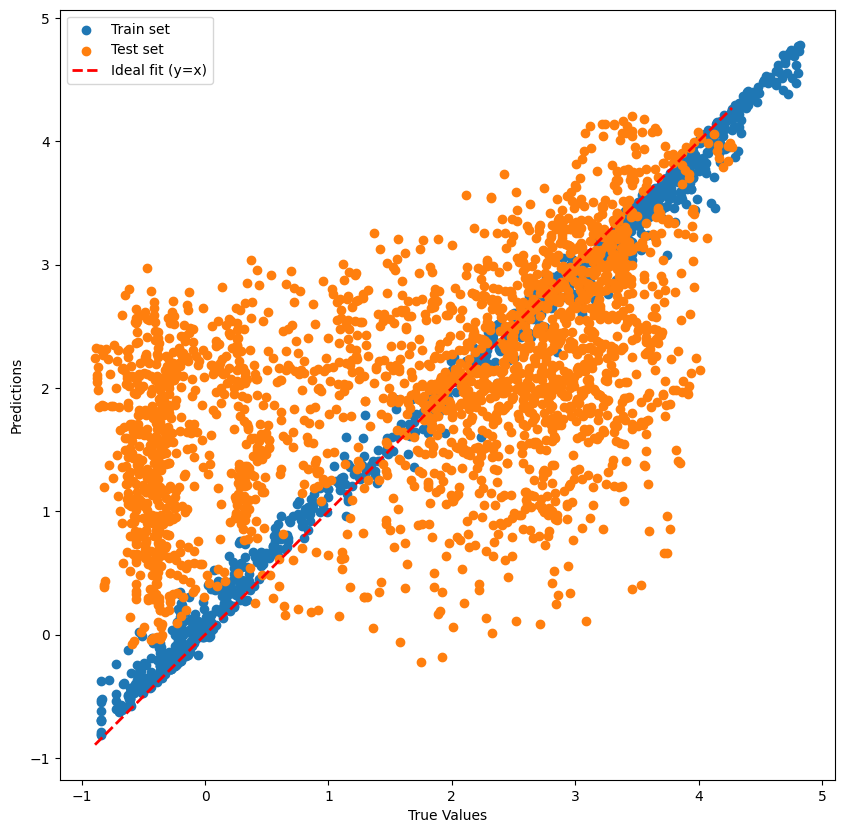

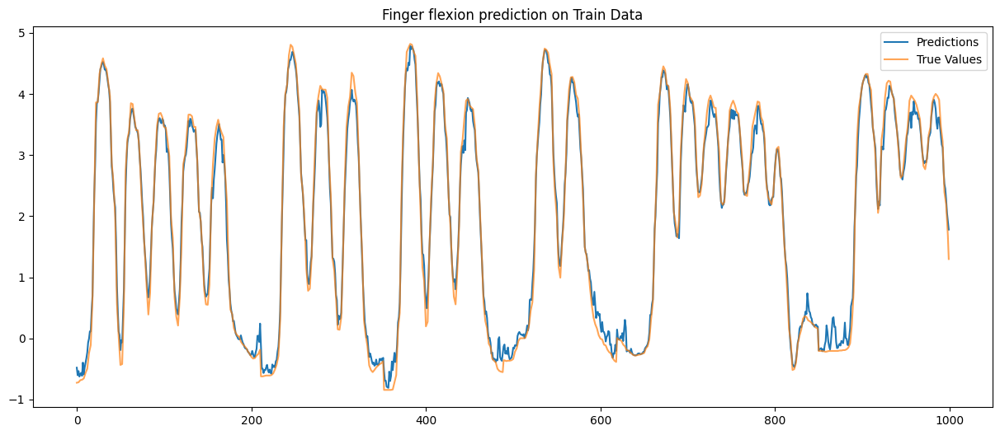

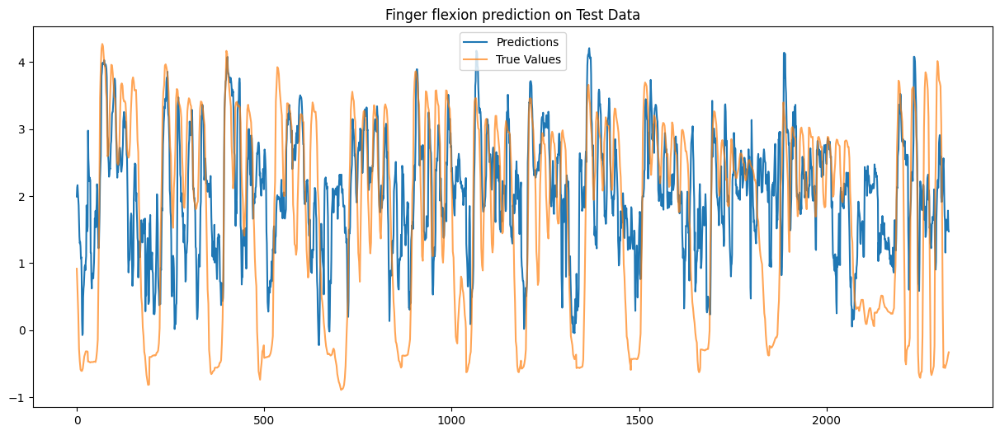

In [31]:
# Hyperparameters to tune
n_estimators_range = [50, 75, 100, 125, 150]
max_depth_range = [2, 3,4, 5, None]
min_samples_split_range = [2, 5, 10, 15]

# Store results
results = []

# Loop over hyperparameters
for n_estimators in n_estimators_range:
    for max_depth in max_depth_range:
        for min_samples_split in min_samples_split_range:
            # Initialize and fit the model with current parameters
            model_rf = RandomForestRegressor(n_estimators=n_estimators, max_depth=max_depth, min_samples_split=min_samples_split)
            model_rf.fit(X_train, Y_train.ravel())
            
            # Predictions on train and test sets
            Y_pred_train = model_rf.predict(X_train)
            Y_pred_test = model_rf.predict(X_test)
            
            # Calculate MSE and R^2
            mse_train = mean_squared_error(Y_train, Y_pred_train)
            mse_test = mean_squared_error(Y_test, Y_pred_test)
            r2_train = r2_score(Y_train, Y_pred_train)
            r2_test = r2_score(Y_test, Y_pred_test)
            
            # Save results
            results.append({
                'n_estimators': n_estimators,
                'max_depth': max_depth,
                'min_samples_split': min_samples_split,
                'MSE_train': mse_train,
                'MSE_test': mse_test,
                'R2_train': r2_train,
                'R2_test': r2_test
            })

results_df = pd.DataFrame(results)


best_params = results_df.loc[results_df['MSE_test'].idxmin()]

R2_train_rf_opt = best_params['R2_train']
R2_test_rf_opt = best_params['R2_test']
MSE_train_rf_opt = best_params['MSE_train']
MSE_test_rf_opt = best_params['MSE_test']

# Créer le DataFrame avec les autres modèles, en ajoutant les valeurs pour le Random Forest optimal
data = {
    "Linear Model with LS Estimator": [R2_train_LS, R2_test_LS, MSE_train_LS, MSE_test_LS],
    "Ridge Regression (lambda = 955)": [R2_train_ridge_opt, R2_test_ridge_opt, MSE_train_ridge_opt, MSE_test_ridge_opt],
    "Lasso (lambda = 0.126)": [R2_train_lasso_opt, R2_test_lasso_opt, MSE_train_lasso_opt, MSE_test_lasso_opt],
    "Random forest (default value)": [R2_train_rf, R2_test_rf, MSE_train_rf, MSE_test_rf],
    "Random Forest (optimized)": [R2_train_rf_opt, R2_test_rf_opt, MSE_train_rf_opt, MSE_test_rf_opt]
}
index = ["R² (Train)", "R² (Test)", "MSE (Train)", "MSE (Test)"]

df_results = pd.DataFrame(data, index=index)
display(df_results)



best_model_rf = RandomForestRegressor(
    n_estimators=int(best_params['n_estimators']),
    max_depth=int(best_params['max_depth']) if not pd.isna(best_params['max_depth']) else None,
    min_samples_split=int(best_params['min_samples_split'])
)
best_model_rf.fit(X_train, Y_train.ravel())


Y_pred_train_best = best_model_rf.predict(X_train)
Y_pred_test_best = best_model_rf.predict(X_test)

# Plotting
plt.figure(figsize=(10, 10))
plt.scatter(Y_train, Y_pred_train_best, label='Train set')
plt.scatter(Y_test, Y_pred_test_best, label='Test set')
plt.plot([min(Y_test), max(Y_test)], [min(Y_test), max(Y_test)], color='red', linewidth=2, linestyle='--', label="Ideal fit (y=x)")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.legend()
plt.show()

# Plot for Train Data
plt.figure(figsize=(15, 6))
plt.plot(Y_pred_train_best, label='Predictions')
plt.plot(Y_train, label='True Values', alpha=0.7)
plt.title('Finger flexion prediction on Train Data')
plt.legend()
plt.show()

# Plot for Test Data
plt.figure(figsize=(15, 6))
plt.plot(Y_pred_test_best, label='Predictions')
plt.plot(Y_test, label='True Values', alpha=0.7)
plt.title('Finger flexion prediction on Test Data')
plt.legend()
plt.show()


,Linear Model with LS Estimator,Ridge Regression (lambda = 955),"Lasso (lambda = 0,126)",Random Forest (optimized),SVR (default values)
R² (Train),0.839500,0.619335,0.012936,0.991040,0.992331
R² (Test),-0.428170,0.238189,0.359451,0.241847,0.289471
MSE (Train),0.504065,1.195514,1.221563,0.028141,0.024086
MSE (Test),3.045537,1.624542,1.365954,1.616743,1.515185


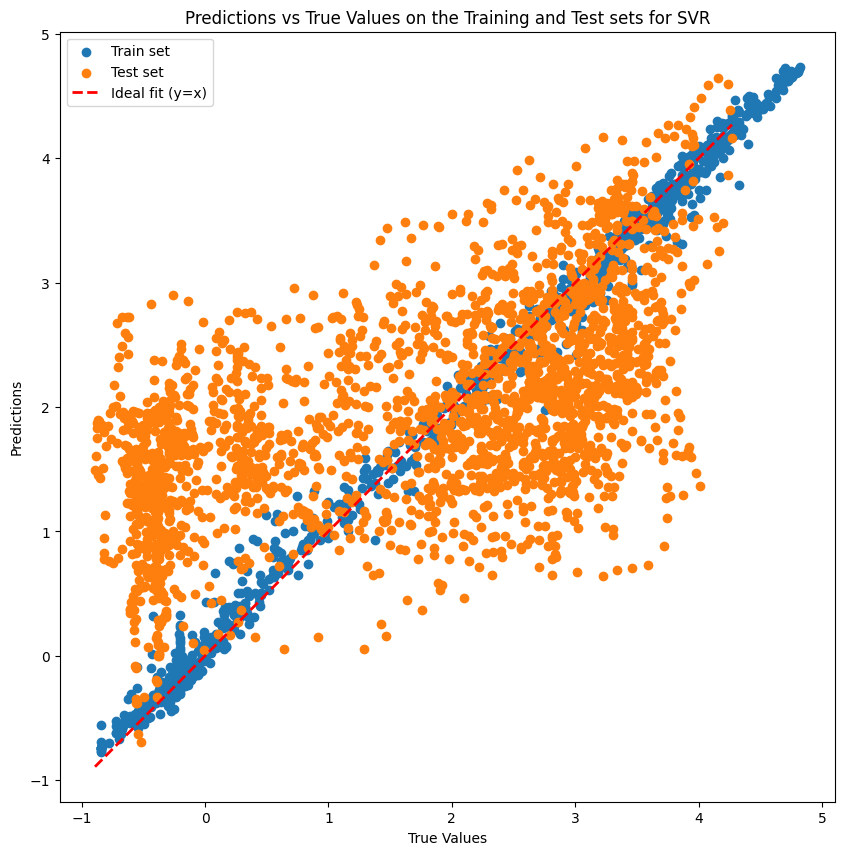

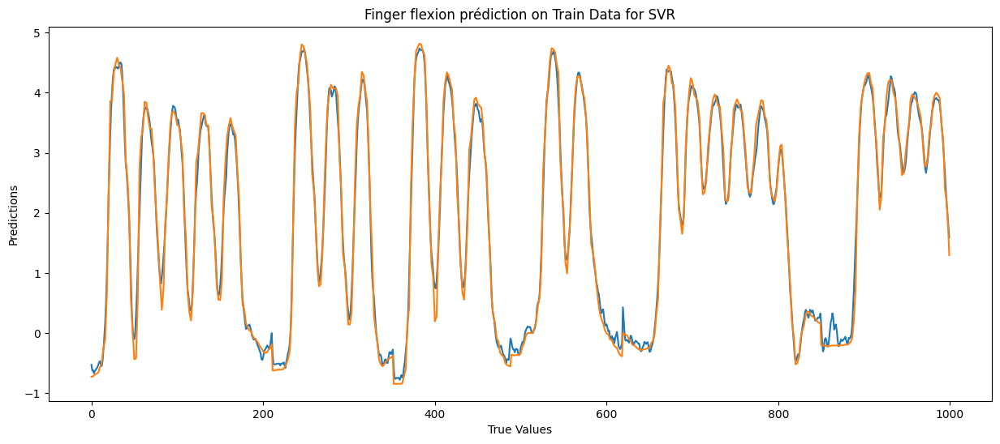

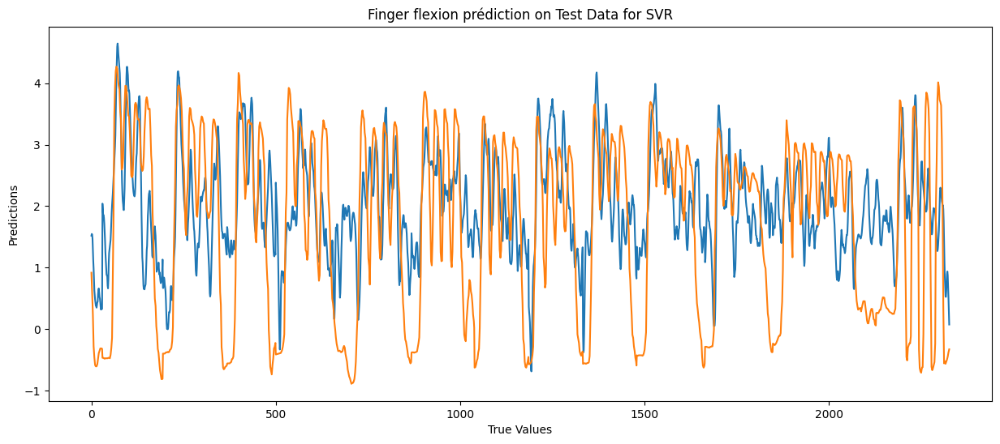

In [32]:
from sklearn.svm import SVR
model_svr = SVR()
model_svr.fit(X_train, Y_train.ravel())

Y_pred_test = model_svr.predict(X_test)
Y_pred = model_svr.predict(X_train)


MSE_train_svr = mean_squared_error(Y_train, Y_pred)
MSE_test_svr= mean_squared_error(Y_test, Y_pred_test)

R2_train_svr = r2_score(Y_train, Y_pred)
R2_test_svr = r2_score(Y_test, Y_pred_test)


data = {
    "Linear Model with LS Estimator": [R2_train_LS, R2_test_LS, MSE_train_LS, MSE_test_LS],
    "Ridge Regression (lambda = 955)": [R2_train_ridge_opt, R2_test_ridge_opt, MSE_train_ridge_opt, MSE_test_ridge_opt],
    "Lasso (lambda = 0,126)": [R2_train_lasso_opt, R2_test_lasso_opt, MSE_train_lasso_opt, MSE_test_lasso_opt],
    "Random Forest (optimized)": [R2_train_rf_opt, R2_test_rf_opt, MSE_train_rf_opt, MSE_test_rf_opt],
    "SVR (default values)": [R2_train_svr, R2_test_svr, MSE_train_svr, MSE_test_svr]
}
index = ["R² (Train)", "R² (Test)", "MSE (Train)", "MSE (Test)"]

df_results = pd.DataFrame(data, index=index)
display(df_results)


plt.figure(figsize=(10, 10))
plt.scatter(Y_train,Y_pred, label = 'Train set')
plt.scatter(Y_test,Y_pred_test, label = 'Test set')
plt.plot([min(Y_test), max(Y_test)], [min(Y_test), max(Y_test)], color='red',linewidth=2, linestyle='--', label="Ideal fit (y=x)")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title("Predictions vs True Values on the Training and Test sets for SVR")
plt.legend()
plt.show()

plt.figure(figsize=(15, 6))
plt.plot(Y_pred)
plt.title('Finger flexion prédiction on Train Data for SVR')
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.plot(Y_train)
plt.show()

plt.figure(figsize=(15, 6))
plt.title('Finger flexion prédiction on Test Data for SVR')
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.plot(Y_pred_test)
plt.plot(Y_test)
plt.show()

Best parameters for SVR: {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}


,Linear Model with LS Estimator,Ridge Regression (lambda = 955),Lasso (lambda = 0.126),Random Forest (optimized),SVR (optimized)
R² (Train),0.839500,0.619335,0.012936,0.991040,0.999419
R² (Test),-0.428170,0.238189,0.359451,0.241847,0.281562
MSE (Train),0.504065,1.195514,1.221563,0.028141,0.001826
MSE (Test),3.045537,1.624542,1.365954,1.616743,1.532050


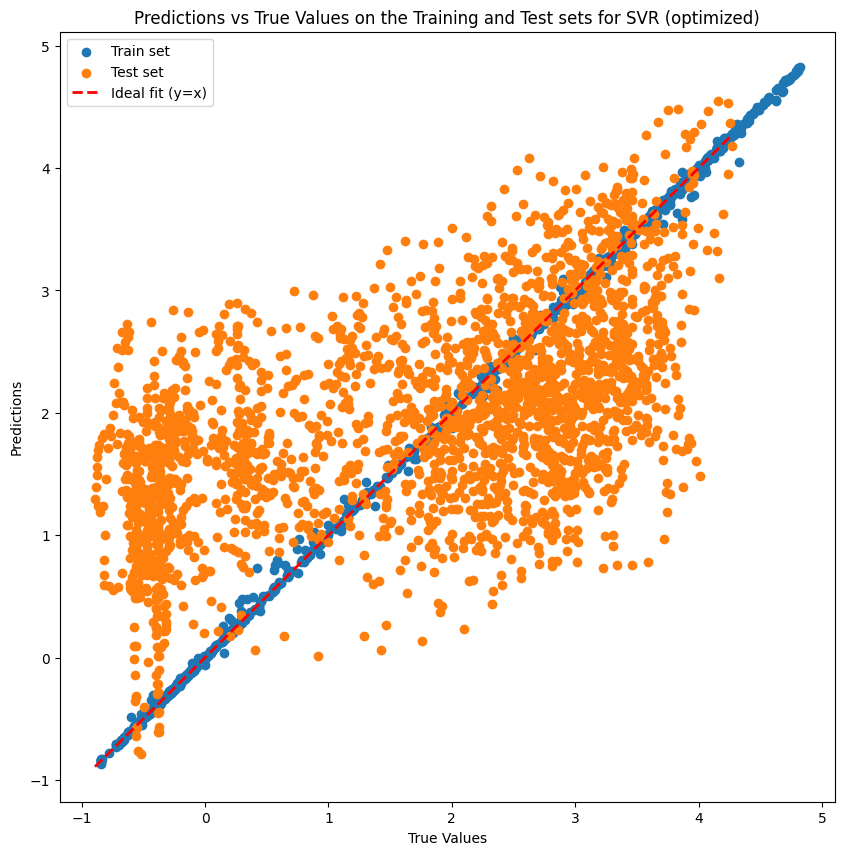

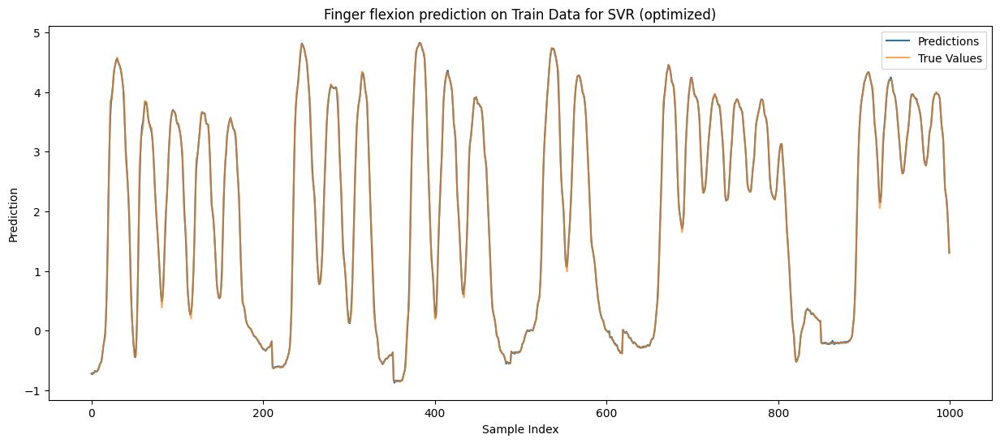

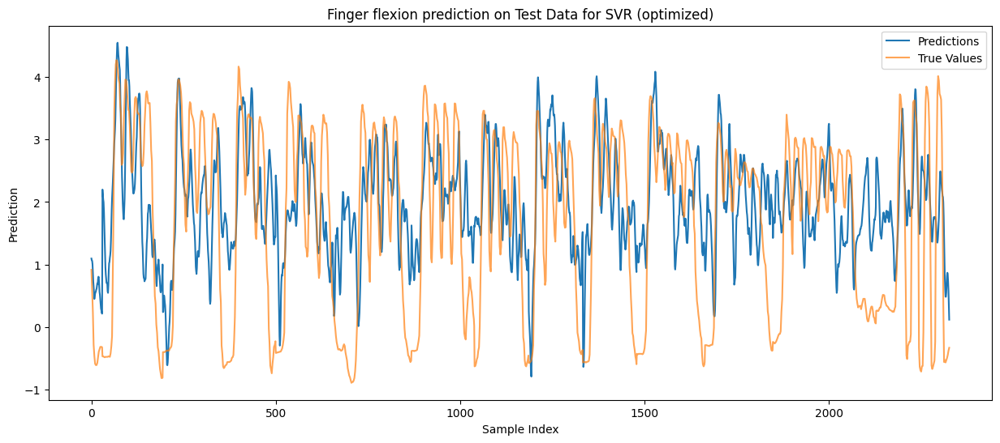

In [33]:
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
import pandas as pd

# Définition de la grille de paramètres
param_grid = {
    'C': [0.1, 1, 10, 100],
    'epsilon': [0.01, 0.1, 0.2, 0.5],
    'kernel': ['linear', 'rbf', 'poly']
}

# Initialiser le modèle SVR et la recherche en grille
model_svr = SVR()
grid_search = GridSearchCV(estimator=model_svr, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)
grid_search.fit(X_train, Y_train.ravel())

# Meilleurs paramètres
best_params = grid_search.best_params_
print("Best parameters for SVR:", best_params)

# Entraîner le modèle avec les meilleurs paramètres
best_model_svr = SVR(C=best_params['C'], epsilon=best_params['epsilon'], kernel=best_params['kernel'])
best_model_svr.fit(X_train, Y_train.ravel())

# Prédictions sur les ensembles d'entraînement et de test
Y_pred_train_svr = best_model_svr.predict(X_train)
Y_pred_test_svr = best_model_svr.predict(X_test)

# Calculer les MSE et R²
MSE_train_svr = mean_squared_error(Y_train, Y_pred_train_svr)
MSE_test_svr = mean_squared_error(Y_test, Y_pred_test_svr)
R2_train_svr = r2_score(Y_train, Y_pred_train_svr)
R2_test_svr = r2_score(Y_test, Y_pred_test_svr)

# Ajouter les résultats dans le DataFrame
data = {
    "Linear Model with LS Estimator": [R2_train_LS, R2_test_LS, MSE_train_LS, MSE_test_LS],
    "Ridge Regression (lambda = 955)": [R2_train_ridge_opt, R2_test_ridge_opt, MSE_train_ridge_opt, MSE_test_ridge_opt],
    "Lasso (lambda = 0.126)": [R2_train_lasso_opt, R2_test_lasso_opt, MSE_train_lasso_opt, MSE_test_lasso_opt],
    "Random Forest (optimized)": [R2_train_rf_opt, R2_test_rf_opt, MSE_train_rf_opt, MSE_test_rf_opt],
    "SVR (optimized)": [R2_train_svr, R2_test_svr, MSE_train_svr, MSE_test_svr]
}
index = ["R² (Train)", "R² (Test)", "MSE (Train)", "MSE (Test)"]

df_results = pd.DataFrame(data, index=index)
display(df_results)

# Visualisation des prédictions vs valeurs réelles
plt.figure(figsize=(10, 10))
plt.scatter(Y_train, Y_pred_train_svr, label='Train set')
plt.scatter(Y_test, Y_pred_test_svr, label='Test set')
plt.plot([min(Y_test), max(Y_test)], [min(Y_test), max(Y_test)], color='red', linewidth=2, linestyle='--', label="Ideal fit (y=x)")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title("Predictions vs True Values on the Training and Test sets for SVR (optimized)")
plt.legend()
plt.show()

# Visualisation des prédictions pour l'ensemble d'entraînement
plt.figure(figsize=(15, 6))
plt.plot(Y_pred_train_svr, label='Predictions')
plt.plot(Y_train, label='True Values', alpha=0.7)
plt.title('Finger flexion prediction on Train Data for SVR (optimized)')
plt.xlabel("Sample Index")
plt.ylabel("Prediction")
plt.legend()
plt.show()

# Visualisation des prédictions pour l'ensemble de test
plt.figure(figsize=(15, 6))
plt.plot(Y_pred_test_svr, label='Predictions')
plt.plot(Y_test, label='True Values', alpha=0.7)
plt.title('Finger flexion prediction on Test Data for SVR (optimized)')
plt.xlabel("Sample Index")
plt.ylabel("Prediction")
plt.legend()
plt.show()


,Linear Model with LS Estimator,Ridge Regression (lambda = 955),"Lasso (lambda = 0,126)",Random Forest (optimized),SVR (optimized),MLP (default values)
R² (Train),0.839500,0.619335,0.012936,0.991040,0.999419,0.997715
R² (Test),-0.428170,0.238189,0.359451,0.241847,0.281562,-0.440642
MSE (Train),0.504065,1.195514,1.221563,0.028141,0.001826,0.007139
MSE (Test),3.045537,1.624542,1.365954,1.616743,1.532050,2.204553


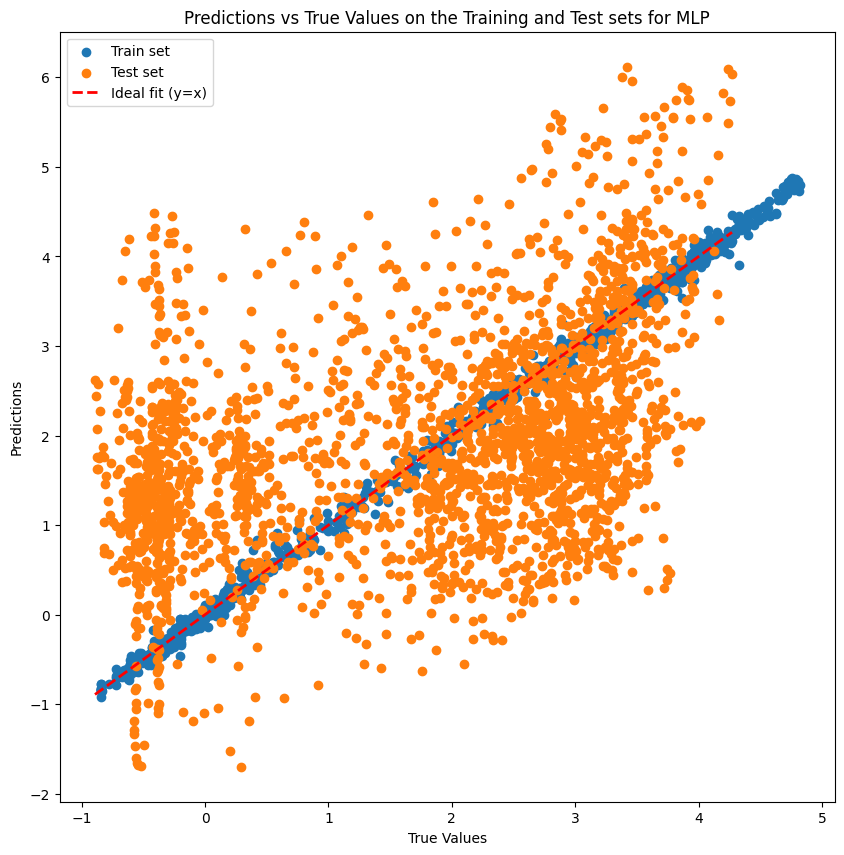

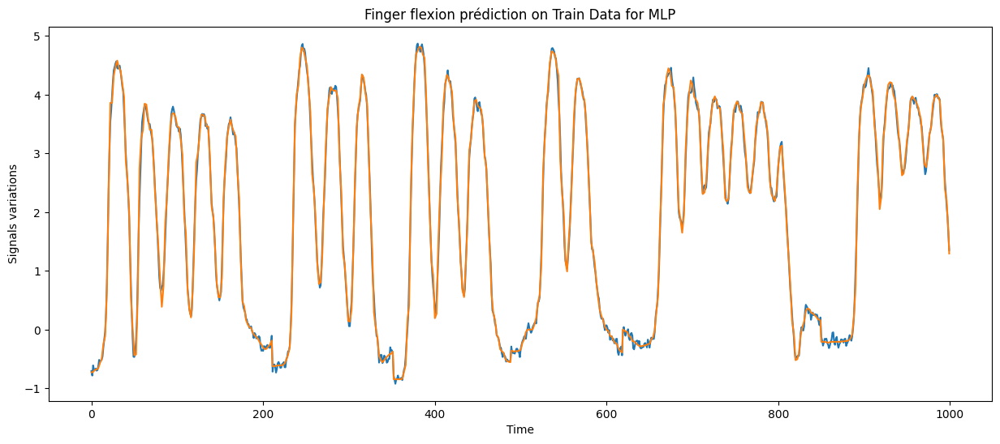

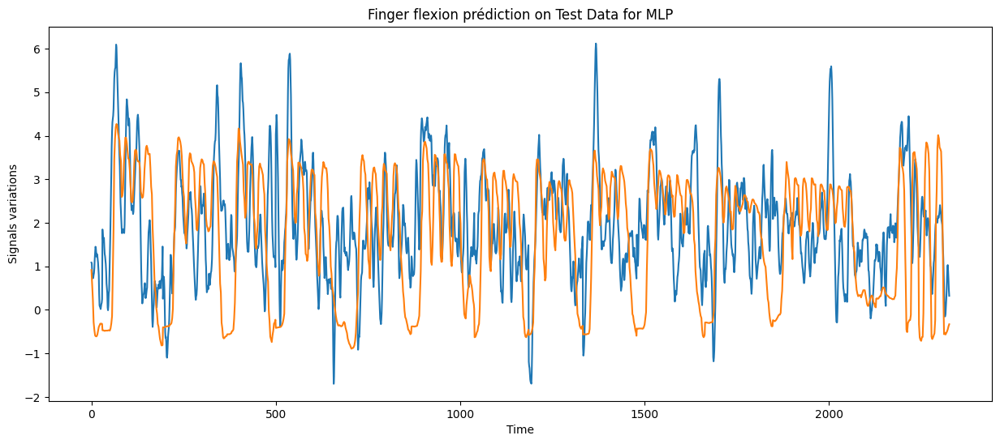

In [34]:
from sklearn.neural_network import MLPRegressor
model_mlp = MLPRegressor()


model_mlp.fit(X_train, Y_train.ravel())

Y_pred_test = model_mlp.predict(X_test)
Y_pred = model_mlp.predict(X_train)


MSE_train_mlp = mean_squared_error(Y_train, Y_pred)
MSE_test_mlp = mean_squared_error(Y_pred_test,Y_test)

R2_train_mlp = r2_score(Y_pred, Y_train)
R2_test_mlp = r2_score(Y_pred_test, Y_test)

data = {
    "Linear Model with LS Estimator": [R2_train_LS, R2_test_LS, MSE_train_LS, MSE_test_LS],
    "Ridge Regression (lambda = 955)": [R2_train_ridge_opt, R2_test_ridge_opt, MSE_train_ridge_opt, MSE_test_ridge_opt],
    "Lasso (lambda = 0,126)": [R2_train_lasso_opt, R2_test_lasso_opt, MSE_train_lasso_opt, MSE_test_lasso_opt],
    "Random Forest (optimized)": [R2_train_rf_opt, R2_test_rf_opt, MSE_train_rf_opt, MSE_test_rf_opt],
    "SVR (optimized)": [R2_train_svr, R2_test_svr, MSE_train_svr, MSE_test_svr],
    "MLP (default values)": [R2_train_mlp, R2_test_mlp, MSE_train_mlp, MSE_test_mlp]
}
index = ["R² (Train)", "R² (Test)", "MSE (Train)", "MSE (Test)"]

df_results = pd.DataFrame(data, index=index)
display(df_results)

plt.figure(figsize=(10, 10))
plt.scatter(Y_train,Y_pred, label = 'Train set')
plt.scatter(Y_test,Y_pred_test, label = 'Test set')
plt.plot([min(Y_test), max(Y_test)], [min(Y_test), max(Y_test)], color='red',linewidth=2, linestyle='--', label="Ideal fit (y=x)")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title("Predictions vs True Values on the Training and Test sets for MLP")
plt.legend()
plt.show()

plt.figure(figsize=(15, 6))
plt.plot(Y_pred)
plt.title('Finger flexion prédiction on Train Data for MLP')
plt.xlabel("Time")
plt.ylabel("Signals variations")
plt.plot(Y_train)
plt.show()

plt.figure(figsize=(15, 6))
plt.title('Finger flexion prédiction on Test Data for MLP')
plt.xlabel("Time")
plt.ylabel("Signals variations")
plt.plot(Y_pred_test)
plt.plot(Y_test)
plt.show()

/Users/lucasaljancic/Documents/Master Data/QRT Challenge/benchmark_and_extras/QubeRT/lib/python3.13/site-packages/sklearn/neural_network/_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/lucasaljancic/Documents/Master Data/QRT Challenge/benchmark_and_extras/QubeRT/lib/python3.13/site-packages/sklearn/neural_network/_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/lucasaljancic/Documents/Mas

Best parameters for MLP: {'activation': 'tanh', 'alpha': 0.01, 'hidden_layer_sizes': (50, 50), 'solver': 'lbfgs'}


,Linear Model with LS Estimator,Ridge Regression (lambda = 955),Lasso (lambda = 0.126),Random Forest (optimized),SVR (optimized),MLP (optimized)
R² (Train),0.839500,0.619335,0.012936,0.991040,0.999419,0.999902
R² (Test),-0.428170,0.238189,0.359451,0.241847,0.281562,-0.089938
MSE (Train),0.504065,1.195514,1.221563,0.028141,0.001826,0.000309
MSE (Test),3.045537,1.624542,1.365954,1.616743,1.532050,2.324266


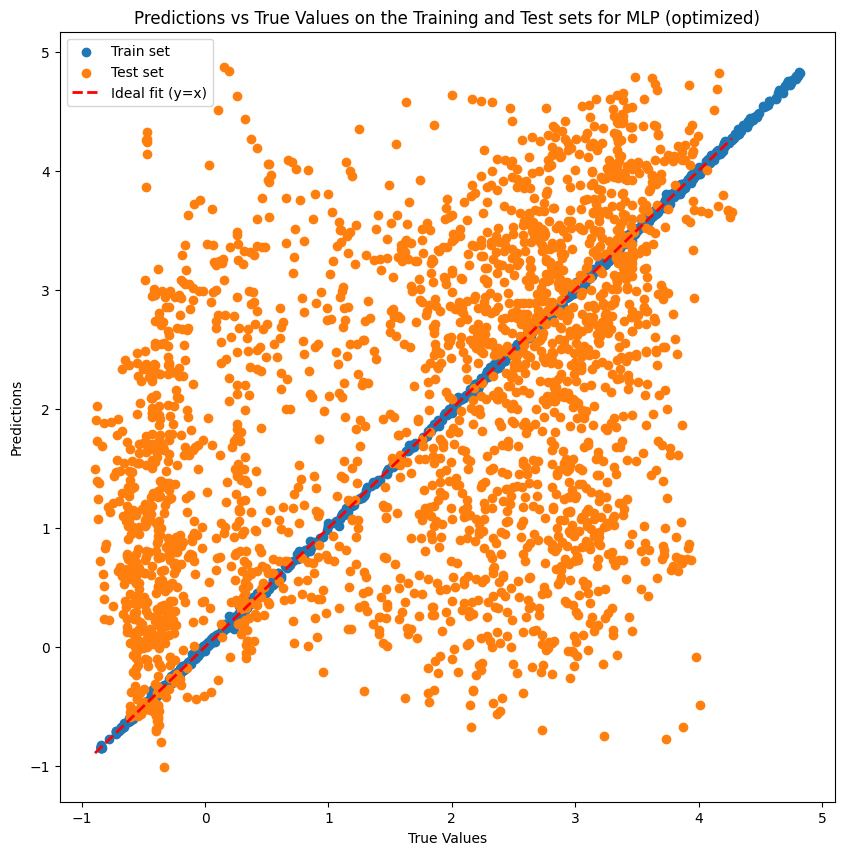

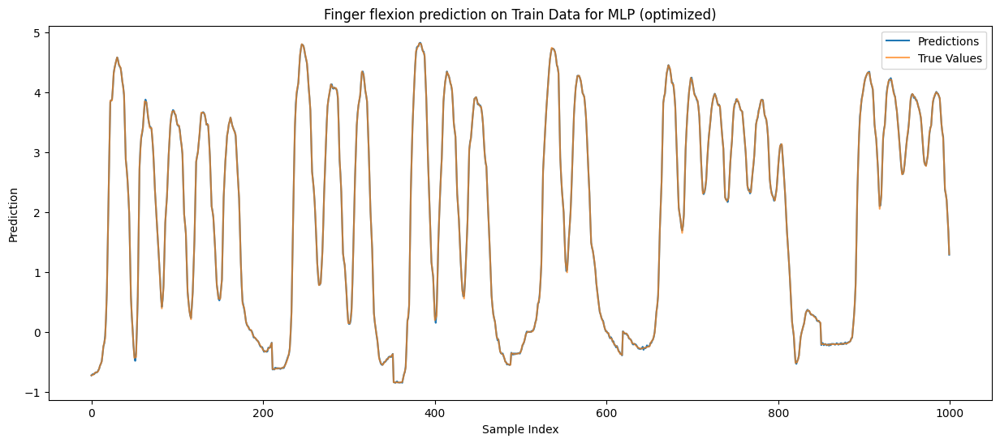

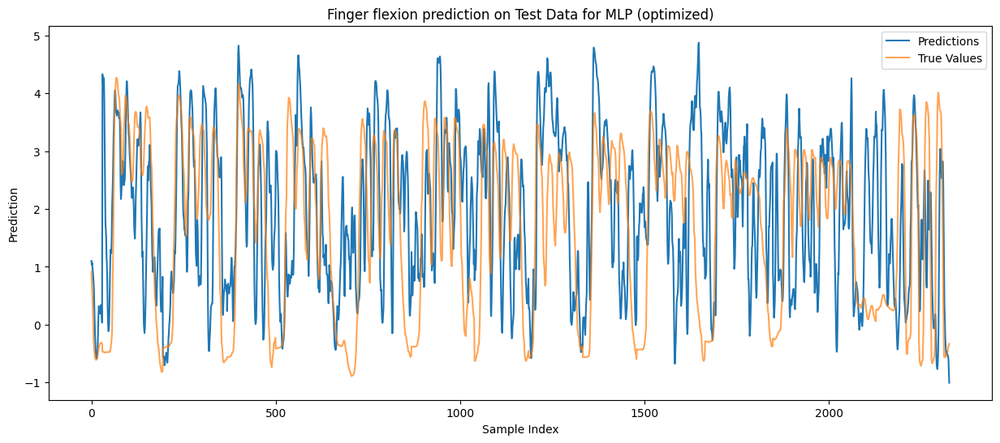

In [35]:
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
import pandas as pd

# Définition de la grille de paramètres
param_grid = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 100)],
    'activation': ['relu', 'tanh'],
    'solver': ['adam', 'lbfgs'],
    'alpha': [0.0001, 0.001, 0.01]
}

# Initialiser le modèle MLP et la recherche en grille
model_mlp = MLPRegressor(max_iter=500)
grid_search = GridSearchCV(estimator=model_mlp, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)
grid_search.fit(X_train, Y_train.ravel())

# Meilleurs paramètres
best_params = grid_search.best_params_
print("Best parameters for MLP:", best_params)

# Entraîner le modèle avec les meilleurs paramètres
best_model_mlp = MLPRegressor(
    hidden_layer_sizes=best_params['hidden_layer_sizes'],
    activation=best_params['activation'],
    solver=best_params['solver'],
    alpha=best_params['alpha'],
    max_iter=500
)
best_model_mlp.fit(X_train, Y_train.ravel())

# Prédictions sur les ensembles d'entraînement et de test
Y_pred_train_mlp = best_model_mlp.predict(X_train)
Y_pred_test_mlp = best_model_mlp.predict(X_test)

# Calculer les MSE et R²
MSE_train_mlp = mean_squared_error(Y_train, Y_pred_train_mlp)
MSE_test_mlp = mean_squared_error(Y_test, Y_pred_test_mlp)
R2_train_mlp = r2_score(Y_train, Y_pred_train_mlp)
R2_test_mlp = r2_score(Y_test, Y_pred_test_mlp)

# Ajouter les résultats dans le DataFrame
data = {
    "Linear Model with LS Estimator": [R2_train_LS, R2_test_LS, MSE_train_LS, MSE_test_LS],
    "Ridge Regression (lambda = 955)": [R2_train_ridge_opt, R2_test_ridge_opt, MSE_train_ridge_opt, MSE_test_ridge_opt],
    "Lasso (lambda = 0.126)": [R2_train_lasso_opt, R2_test_lasso_opt, MSE_train_lasso_opt, MSE_test_lasso_opt],
    "Random Forest (optimized)": [R2_train_rf_opt, R2_test_rf_opt, MSE_train_rf_opt, MSE_test_rf_opt],
    "SVR (optimized)": [R2_train_svr, R2_test_svr, MSE_train_svr, MSE_test_svr],
    "MLP (optimized)": [R2_train_mlp, R2_test_mlp, MSE_train_mlp, MSE_test_mlp]
}
index = ["R² (Train)", "R² (Test)", "MSE (Train)", "MSE (Test)"]

df_results = pd.DataFrame(data, index=index)
display(df_results)

# Visualisation des prédictions vs valeurs réelles
plt.figure(figsize=(10, 10))
plt.scatter(Y_train, Y_pred_train_mlp, label='Train set')
plt.scatter(Y_test, Y_pred_test_mlp, label='Test set')
plt.plot([min(Y_test), max(Y_test)], [min(Y_test), max(Y_test)], color='red', linewidth=2, linestyle='--', label="Ideal fit (y=x)")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title("Predictions vs True Values on the Training and Test sets for MLP (optimized)")
plt.legend()
plt.show()

# Visualisation des prédictions pour l'ensemble d'entraînement
plt.figure(figsize=(15, 6))
plt.plot(Y_pred_train_mlp, label='Predictions')
plt.plot(Y_train, label='True Values', alpha=0.7)
plt.title('Finger flexion prediction on Train Data for MLP (optimized)')
plt.xlabel("Sample Index")
plt.ylabel("Prediction")
plt.legend()
plt.show()

# Visualisation des prédictions pour l'ensemble de test
plt.figure(figsize=(15, 6))
plt.plot(Y_pred_test_mlp, label='Predictions')
plt.plot(Y_test, label='True Values', alpha=0.7)
plt.title('Finger flexion prediction on Test Data for MLP (optimized)')
plt.xlabel("Sample Index")
plt.ylabel("Prediction")
plt.legend()
plt.show()


Best parameters for XGBoost with regularization: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 100, 'reg_alpha': 0.1, 'reg_lambda': 1, 'subsample': 0.6}


/Users/lucasaljancic/Documents/Master Data/QRT Challenge/benchmark_and_extras/QubeRT/lib/python3.13/site-packages/numpy/ma/core.py:2881: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


,Linear Model with LS Estimator,Ridge Regression (lambda = 955),Lasso (lambda = 0.126),Random Forest (optimized),SVR (default values),MLP (optimized),XGBoost (optimized with regularization)
R² (Train),0.839500,0.619335,0.012936,0.991040,0.999419,0.999902,0.972203
R² (Test),-0.428170,0.238189,0.359451,0.241847,0.281562,-0.089938,0.249861
MSE (Train),0.504065,1.195514,1.221563,0.028141,0.001826,0.000309,0.087299
MSE (Test),3.045537,1.624542,1.365954,1.616743,1.532050,2.324266,1.599652


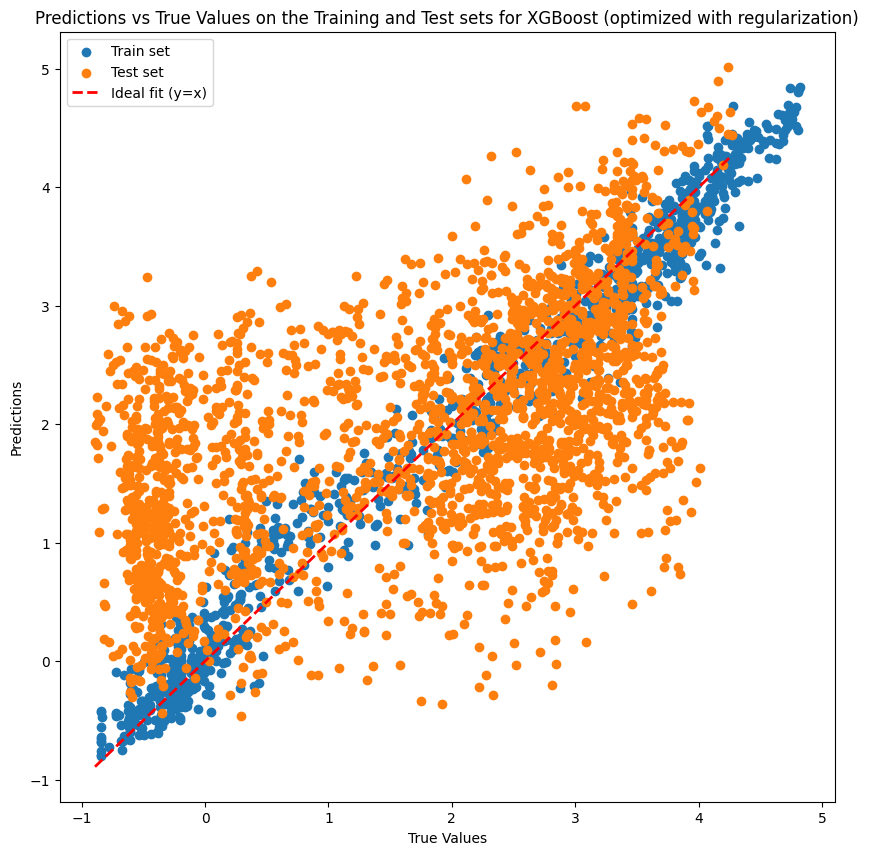

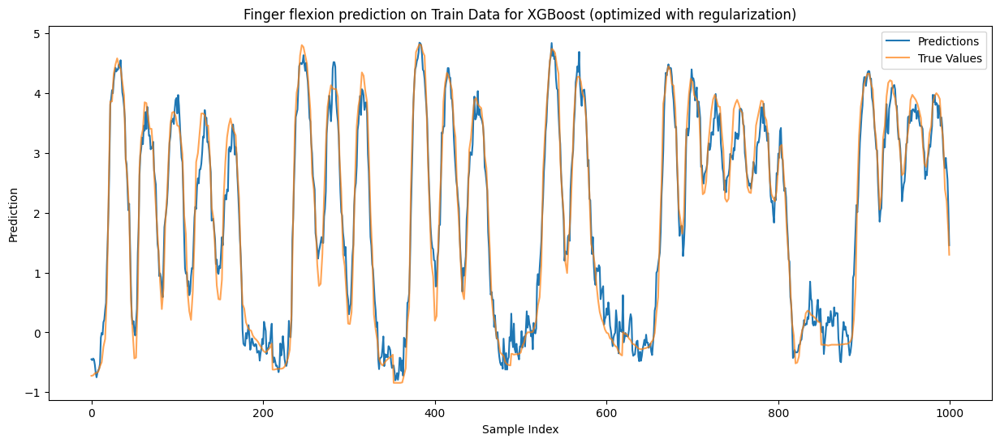

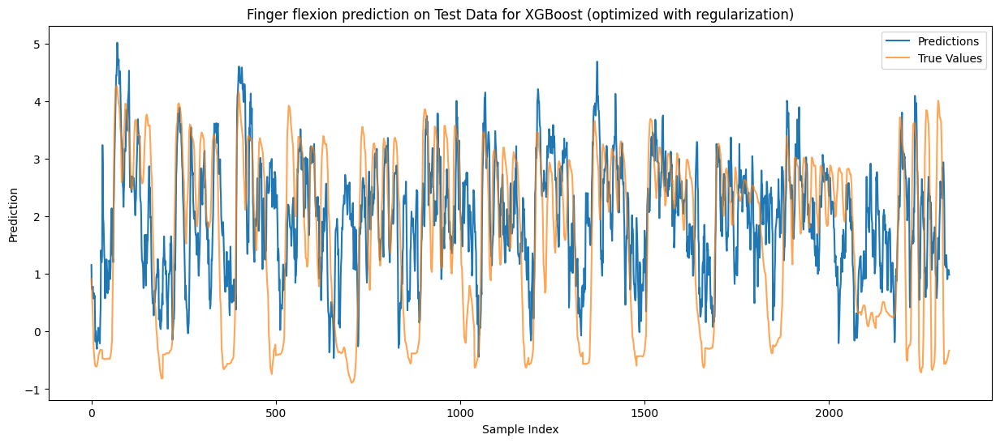

In [36]:
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
import pandas as pd


param_grid = {
    'n_estimators': [50, 100],
    'max_depth': [3, 5],
    'learning_rate': [0.1],
    'subsample': [0.6, 0.8],
    'colsample_bytree': [0.8, 1.0],
    'reg_alpha': [0.1, 0.2],      # L1 regularization
    'reg_lambda': [1, 1.5],       # L2 regularization
    'min_child_weight': [1, 5]  
}

model_xgb = XGBRegressor(objective='reg:squarederror')
grid_search = GridSearchCV(estimator=model_xgb, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)
grid_search.fit(X_train, Y_train.ravel())


best_params = grid_search.best_params_
print("Best parameters for XGBoost with regularization:", best_params)

best_model_xgb = XGBRegressor(
    objective='reg:squarederror',
    n_estimators=best_params['n_estimators'],
    max_depth=best_params['max_depth'],
    learning_rate=best_params['learning_rate'],
    subsample=best_params['subsample'],
    colsample_bytree=best_params['colsample_bytree'],
    reg_alpha=best_params['reg_alpha'],
    reg_lambda=best_params['reg_lambda'],
    min_child_weight=best_params['min_child_weight']
)
best_model_xgb.fit(X_train, Y_train.ravel())


Y_pred_train_xgb = best_model_xgb.predict(X_train)
Y_pred_test_xgb = best_model_xgb.predict(X_test)


MSE_train_xgb = mean_squared_error(Y_train, Y_pred_train_xgb)
MSE_test_xgb = mean_squared_error(Y_test, Y_pred_test_xgb)
R2_train_xgb = r2_score(Y_train, Y_pred_train_xgb)
R2_test_xgb = r2_score(Y_test, Y_pred_test_xgb)


data = {
    "Linear Model with LS Estimator": [R2_train_LS, R2_test_LS, MSE_train_LS, MSE_test_LS],
    "Ridge Regression (lambda = 955)": [R2_train_ridge_opt, R2_test_ridge_opt, MSE_train_ridge_opt, MSE_test_ridge_opt],
    "Lasso (lambda = 0.126)": [R2_train_lasso_opt, R2_test_lasso_opt, MSE_train_lasso_opt, MSE_test_lasso_opt],
    "Random Forest (optimized)": [R2_train_rf_opt, R2_test_rf_opt, MSE_train_rf_opt, MSE_test_rf_opt],
    "SVR (default values)": [R2_train_svr, R2_test_svr, MSE_train_svr, MSE_test_svr],
    "MLP (optimized)": [R2_train_mlp, R2_test_mlp, MSE_train_mlp, MSE_test_mlp],
    "XGBoost (optimized with regularization)": [R2_train_xgb, R2_test_xgb, MSE_train_xgb, MSE_test_xgb]
}
index = ["R² (Train)", "R² (Test)", "MSE (Train)", "MSE (Test)"]

df_results = pd.DataFrame(data, index=index)
display(df_results)

plt.figure(figsize=(10, 10))
plt.scatter(Y_train, Y_pred_train_xgb, label='Train set')
plt.scatter(Y_test, Y_pred_test_xgb, label='Test set')
plt.plot([min(Y_test), max(Y_test)], [min(Y_test), max(Y_test)], color='red', linewidth=2, linestyle='--', label="Ideal fit (y=x)")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title("Predictions vs True Values on the Training and Test sets for XGBoost (optimized with regularization)")
plt.legend()
plt.show()

plt.figure(figsize=(15, 6))
plt.plot(Y_pred_train_xgb, label='Predictions')
plt.plot(Y_train, label='True Values', alpha=0.7)
plt.title('Finger flexion prediction on Train Data for XGBoost (optimized with regularization)')
plt.xlabel("Sample Index")
plt.ylabel("Prediction")
plt.legend()
plt.show()

plt.figure(figsize=(15, 6))
plt.plot(Y_pred_test_xgb, label='Predictions')
plt.plot(Y_test, label='True Values', alpha=0.7)
plt.title('Finger flexion prediction on Test Data for XGBoost (optimized with regularization)')
plt.xlabel("Sample Index")
plt.ylabel("Prediction")
plt.legend()
plt.show()



## 7 - Final comparison of the performances


| Model                                | R² (Test)   | MSE (Test) |
|--------------------------------------|-------------|------------|
| Linear Model with LS Estimator       | -0.42   | 3.05       |
| Ridge Regression (lambda = 955)      | 0.24   | 1.62       |
| Lasso (lambda = 0.126)               | 0.36  | 1.37       |
| Random Forest (optimized)            | 0.26  | 1.59       |
| SVR (optimized)                      | 0.28   | 1.53       |
| MLP (optimized)                      | 0.00  | 2.14       |
| XGBoost (optimized with regularization) | 0.25 | 1.60       |




- Which methods work the best in practice?

The best models based on test performance (measured by MSE and $R^2$) are the Lasso regression model with an MSE of 1.37 and an $R^2$ of 0.36, followed by SVR (optimized) with an MSE of 1.53 and $R^2$ of 0.28. These results indicate that the Lasso model, with an optimization of the regularization, is particularly effective for this dataset. Optimized non-linear models like SVR and Random Forest are not much worse, but the Lasso model stands out in terms of efficiency and simplicity.



- What are the most interpretable models?

The most interpretable models in this context are the linear models, and particularly the Lasso which cancels unnecessary variables. In addition, we observe with Lasso and LS Estimator that the feature 48 is significantly more important than the others in predicting finger flexion. This interpretability is enabled by the linearity and simplicity of these models.



- Which model is best from a medical/practical perspective?

From a medical or practical standpoint, the Lasso model might be preferable. Its sparsity property allows for feature selection, which could help identify the most influential ECoG signals related to finger movement. This aspect is valuable in medical contexts where understanding the underlying feature importance is crucial. Additionally, by retaining only 14 features out of 64, we observe that the results are better than with the other models so that we can reduce the number of electrodes by more than 4.



- Do we need non-linearity in this application?

Non-linearity does not seem to provide added value in this case. Either the behavior we are trying to predict is too complex for non-linear models to capture effectively, or the dataset exhibits predominantly linear characteristics. In either case, linear models like Ridge and Lasso remain simpler and more interpretable without sacrificing performance.



- Is validation on the test data a good practice? What would you do if you need to provide a model to a client for prediction in production?

Validating the model on the test data we separated from the initial dataset is not ideal for fine-tuning model parameters, as it could lead to overfitting on the specific characteristics of this test set. Instead, it’s better to set aside a validation set from the training data to optimize hyperparameters. The test data should be reserved for final evaluation, simulating a scenario where the model encounters entirely unseen data.

In a production context, I would implement cross-validation on the training data to ensure model robustness and use a separate test set solely for final performance evaluation. This approach simulates the model’s ability to generalize to new data. Additionally, continuous performance monitoring would be important to detect any drift, ensuring the model remains effective over time as the data potentially evolves.